In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import networkx as nx
import seaborn as sns

from oasis.functions import deconvolve
from scipy.stats import pearsonr
from scipy.linalg import logm

from utils.context_data_csv import ContextDataCSV
from utils.matrix_optimizer import MatrixOptimizer
from utils.useful_tool import find_all_nan_cells, dropped_unique_cells
import utils.sulfur.constant as const

import traceback

/app/OASIS/oasis/functions.py:13: UserWarning: Could not find cvxpy. Don't worry, you can still use OASIS, just not the slower interior point methods we compared to in the papers.
  warn("Could not find cvxpy. Don't worry, you can still use OASIS, " +


In [2]:
engram_shock_cells = {
    'ID181106CreA': ['C261', 'C305', 'C347', 'C349', 'C351'],
    'ID181106CreB': ['C058', 'C089', 'C126'],
    'ID181106CreC': ['C017', 'C065', 'C112', 'C117', 'C203', 'C227'],
    'ID181106CreG': ['C127', 'C239', 'C323', 'C347', 'C350', 'C399', 'C402'],
    'ID181106CreH': ['C164', 'C180', 'C184', 'C243', 'C253', 'C298', 'C327', 'C351', 'C534', 'C542'],
    'ID181106CreI': ['C136', 'C197', 'C273', 'C292', 'C294', 'C306', 'C333'],
    'ID181106CreK': ['C083', 'C088', 'C100', 'C149', 'C390'],
    'ID181106CreL': ['C200'],
    'ID181106CreN': ['C199', 'C255', 'C258', 'C273'],
    'ID181106CreQ': ['C393']
}

non_engram_shock_cells = {
    'ID181106CreA': ['C000', 'C007', 'C009', 'C059', 'C076', 'C084', 'C086', 'C099', 'C101', 'C116', 'C120', 'C124', 'C141', 'C143', 'C145', 'C153', 'C164', 'C173', 'C175', 'C197', 'C198', 'C228', 'C234', 'C235', 'C284', 'C303', 'C306', 'C310', 'C317', 'C325', 'C327', 'C328', 'C336', 'C362', 'C377', 'C442', 'C459', 'C476', 'C479', 'C480', 'C487', 'C491', 'C493', 'C494', 'C519'],
    'ID181106CreB': ['C000', 'C003', 'C009', 'C010', 'C063', 'C066', 'C071', 'C072', 'C073', 'C080', 'C083', 'C088', 'C090', 'C094', 'C100', 'C103', 'C108', 'C109', 'C112', 'C114', 'C115', 'C127', 'C130', 'C131', 'C134', 'C166', 'C168', 'C169', 'C177', 'C178', 'C179', 'C200', 'C202', 'C203', 'C213', 'C230', 'C231', 'C268', 'C279', 'C282', 'C284'],
    'ID181106CreC': ['C002', 'C011', 'C012', 'C016', 'C019', 'C043', 'C045', 'C049', 'C050', 'C054', 'C055', 'C056', 'C058', 'C060', 'C063', 'C070', 'C072', 'C074', 'C076', 'C079', 'C084', 'C086', 'C088', 'C096', 'C105', 'C107', 'C118', 'C127', 'C132', 'C143', 'C144', 'C146', 'C153', 'C155', 'C160', 'C168', 'C186', 'C192', 'C193', 'C194', 'C198', 'C202', 'C205', 'C215', 'C219', 'C224', 'C233', 'C235', 'C237', 'C238', 'C239', 'C241', 'C256', 'C257', 'C262', 'C268', 'C272', 'C276', 'C287', 'C294', 'C295', 'C296'],
    'ID181106CreG': ['C003', 'C004', 'C005', 'C010', 'C011', 'C017', 'C025', 'C063', 'C067', 'C070', 'C071', 'C073', 'C076', 'C089', 'C102', 'C118', 'C126', 'C133', 'C136', 'C142', 'C157', 'C166', 'C177', 'C193', 'C197', 'C199', 'C204', 'C205', 'C210', 'C212', 'C229', 'C232', 'C244', 'C247', 'C249', 'C253', 'C261', 'C273', 'C286', 'C291', 'C293', 'C294', 'C298', 'C302', 'C304', 'C305', 'C309', 'C313', 'C325', 'C338', 'C344', 'C352', 'C353', 'C361', 'C377', 'C385', 'C426', 'C449', 'C458', 'C478'],
    'ID181106CreH': ['C018', 'C021', 'C059', 'C074', 'C081', 'C085', 'C087', 'C125', 'C127', 'C148', 'C160', 'C175', 'C203', 'C218', 'C232', 'C249', 'C252', 'C256', 'C261', 'C268', 'C271', 'C350', 'C361', 'C385', 'C386', 'C395', 'C397', 'C400', 'C404', 'C411', 'C475', 'C490', 'C493', 'C497', 'C498', 'C505', 'C511', 'C520', 'C521', 'C525', 'C529', 'C541', 'C579', 'C594', 'C603', 'C632', 'C636'],
    'ID181106CreI': ['C012', 'C049', 'C061', 'C143', 'C164', 'C166', 'C176', 'C183', 'C214', 'C249', 'C254', 'C256', 'C270', 'C275', 'C281', 'C302', 'C325', 'C326', 'C327', 'C341', 'C352', 'C368'],
    'ID181106CreK': ['C006', 'C045', 'C066', 'C071', 'C075', 'C080', 'C085', 'C102', 'C114', 'C117', 'C123', 'C124', 'C133', 'C136', 'C145', 'C178', 'C180', 'C202', 'C205', 'C206', 'C207', 'C208', 'C233', 'C238', 'C239', 'C243', 'C251', 'C262', 'C267', 'C277', 'C291', 'C297', 'C323', 'C325', 'C341', 'C352', 'C361', 'C376', 'C380', 'C399', 'C403', 'C411', 'C424', 'C428'],
    'ID181106CreL': ['C008', 'C015', 'C020', 'C021', 'C037', 'C040', 'C044', 'C049', 'C061', 'C069', 'C073', 'C074', 'C075', 'C082', 'C085', 'C123', 'C125', 'C126', 'C128', 'C129', 'C132', 'C133', 'C144', 'C150', 'C155', 'C162', 'C173', 'C180', 'C185', 'C196', 'C203', 'C209', 'C211', 'C213', 'C216', 'C224', 'C231', 'C236', 'C243', 'C255', 'C270', 'C273', 'C283', 'C298', 'C312', 'C315', 'C323', 'C332', 'C341', 'C343', 'C344', 'C346', 'C350', 'C353', 'C357', 'C373', 'C414', 'C416', 'C424', 'C439', 'C445', 'C456', 'C461', 'C463', 'C475', 'C498', 'C501'],
    'ID181106CreN': ['C008', 'C022', 'C028', 'C044', 'C048', 'C057', 'C062', 'C069', 'C079', 'C089', 'C098', 'C123', 'C144', 'C168', 'C186', 'C201', 'C204', 'C213', 'C217', 'C227', 'C228', 'C239', 'C261', 'C267', 'C288', 'C290', 'C301', 'C306', 'C309', 'C321', 'C343', 'C355', 'C391', 'C395', 'C397', 'C402', 'C404', 'C410', 'C412', 'C413', 'C416', 'C425', 'C429', 'C441', 'C463', 'C469', 'C490', 'C506', 'C511', 'C517'],
    'ID181106CreQ': ['C000', 'C001', 'C006', 'C009', 'C019', 'C022', 'C033', 'C034', 'C040', 'C042', 'C050', 'C055', 'C057', 'C059', 'C061', 'C070', 'C076', 'C089', 'C092', 'C098', 'C108', 'C118', 'C121', 'C122', 'C123', 'C127', 'C132', 'C134', 'C137', 'C168', 'C169', 'C173', 'C179', 'C181', 'C192', 'C202', 'C205', 'C207', 'C209', 'C214', 'C217', 'C239', 'C260', 'C263', 'C281', 'C284', 'C305', 'C308', 'C316', 'C325', 'C332', 'C333', 'C335', 'C336', 'C343', 'C347', 'C354', 'C362', 'C365', 'C368', 'C372', 'C374', 'C375', 'C380', 'C387', 'C398', 'C412', 'C417', 'C421', 'C426', 'C431', 'C434', 'C455', 'C456', 'C463', 'C464', 'C470', 'C485', 'C491']
}

In [3]:
index = const.ANIMAL_NAMES
columns_df = pd.DataFrame()
contexts = ['A1_1', 'A1_2', 'A1_3', 'A4_1', 'A4_2', 'A4_3']
features = ['clustering coefficient', 'shortest path length', 'co-firing strength', 'average weight', 'average edges', 'assortativity']
context_columns = []
for context_name in contexts:
    context_columns += [context_name] * len(features)
columns_df.loc[:, 'context'] = context_columns
columns_df.loc[:, 'feature'] = features * len(contexts)
columns = pd.MultiIndex.from_frame(columns_df)

engram_df = pd.DataFrame(0.0, index=index, columns=columns)
non_engram_df = pd.DataFrame(0.0, index=index, columns=columns)
engram_shuffle_df = pd.DataFrame(0.0, index=index, columns=columns)
non_engram_shuffle_df = pd.DataFrame(0.0, index=index, columns=columns)

In [4]:
def fetch_preserved_shock_values(shock_cell_name, preserved_shocks):
    if shock_cell_name in preserved_shocks:
        return preserved_shocks[shock_cell_name]
    
    return None

def estimate_spike(matrix, cell_name):
    spike_threshold = 0.05
    
    values = matrix.loc[:, cell_name]
    
    if values.isnull().all():
        return np.zeros(len(values))
    
    _c, spikes, _b, _g, _lam = deconvolve(values.to_numpy(), g=(None, None), penalty=1)
    spikes[spikes <= spike_threshold] = 0.0
    
    return spikes

def append_preserved_shock_values(shock_cell_name, preserved_shocks, spikes):
    if shock_cell_name in preserved_shocks:
        return
    
    preserved_shocks[shock_cell_name] = spikes
    
def is_all_zeros_constant_array(array):
    return np.all(array == 0.0)

def calc_cofiring_graph(matrix, shock_cells, preserved_spikes, start_frame, end_frame):
    spike_threshold = 0.05
    pearsonr_threshold = 0.1
    graph = nx.Graph()
    
    for i in range(len(shock_cells)):
        base_shock_cell = shock_cells[i]
        
        graph.add_node(base_shock_cell)
        
        base_spikes = fetch_preserved_shock_values(base_shock_cell, preserved_spikes)
        if base_spikes is None:
            base_spikes = estimate_spike(matrix, base_shock_cell)
            
        append_preserved_shock_values(base_shock_cell, preserved_spikes, base_spikes)
        
        base_spikes = base_spikes[start_frame:end_frame]
        if is_all_zeros_constant_array(base_spikes):
            continue
        
        for j in range(i + 1, len(shock_cells)):
            compared_shock_cell = shock_cells[j]
            
            compared_spikes = fetch_preserved_shock_values(compared_shock_cell, preserved_spikes)
            if compared_spikes is None:
                compared_spikes = estimate_spike(matrix, compared_shock_cell)
                
            append_preserved_shock_values(compared_shock_cell, preserved_spikes, compared_spikes)
            
            compared_spikes = compared_spikes[start_frame:end_frame]
            
            if is_all_zeros_constant_array(compared_spikes):
                continue

            r, _ = pearsonr(base_spikes, compared_spikes)
            if r >= pearsonr_threshold:
                graph.add_edge(base_shock_cell, compared_shock_cell, weight=r, length=1/r)
                
    return graph

def calc_maximum_distance(graph):
    lengths = nx.all_pairs_dijkstra_path_length(graph)
    
    length_values = []
    for _, value_dict in lengths:
        length_values += value_dict.values()
        
    return max(length_values)

def average_path_length(graph, weight='length'):
    def path_lengths(graph, node, weight='length'):
        lengths = []
        for target in graph:
            if not nx.has_path(graph, node, target):
                continue
                
            lengths.append(nx.dijkstra_path_length(graph, node, target, weight=weight))
        
        return lengths
        
    all_lengths = np.array([])
    for node in graph:
        for length in path_lengths(graph, node, weight=weight):
            all_lengths = np.append(all_lengths, length)
    return np.mean(all_lengths)

def calc_features(animal_name, context_name, graph, df, is_assortativity=True):
    df.loc[animal_name, (context_name, 'clustering coefficient')] += nx.average_clustering(graph, weight='weight')
    df.loc[animal_name, (context_name, 'shortest path length')] += average_path_length(graph, weight='length')
    
    adjacency_matrix = pd.DataFrame(nx.adjacency_matrix(graph).todense())
    n = len(graph.nodes)
    df.loc[animal_name, (context_name, 'co-firing strength')] += adjacency_matrix.sum().mean()
    if is_assortativity:
        df.loc[animal_name, (context_name, 'assortativity')] += nx.degree_pearson_correlation_coefficient(graph, weight='weight')
    df.loc[animal_name, (context_name, 'average weight')] += sum(weight for _, _, weight in graph.edges.data("weight")) / (n * (n - 1))
    df.loc[animal_name, (context_name, 'average edges')] += len(graph.edges.data("weight")) / n
    
def average_features(animal_name, context_name, df, size, is_assortativity=True):
    df.loc[animal_name, (context_name, 'clustering coefficient')] /= size
    df.loc[animal_name, (context_name, 'shortest path length')] /= size
    df.loc[animal_name, (context_name, 'co-firing strength')] /= size
    if is_assortativity:
        df.loc[animal_name, (context_name, 'assortativity')] /= size
    df.loc[animal_name, (context_name, 'average weight')] /= size
    df.loc[animal_name, (context_name, 'average edges')] /= size
    
def all_context_graph(matrix, shock_cells, preserved_spikes, animal_name, context_name, df, start_second=0):
    iter_size = 100
    frame_range = 20
    
    for i in range(start_second, iter_size + start_second):
        index = i * frame_range
        graph = calc_cofiring_graph(matrix, shock_cells, preserved_spikes, index, index + frame_range)
        calc_features(animal_name, context_name, graph, df)
    average_features(animal_name, context_name, df, iter_size)

animal name: ID181106CreA


/opt/conda/lib/python3.8/site-packages/scipy/stats/stats.py:3913: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/opt/conda/lib/python3.8/site-packages/scipy/stats/stats.py:3913: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())


correct count is 10000
animal name: ID181106CreB
not enough values to unpack (expected 2, got 0)
animal name: ID181106CreC
correct count is 9998
animal name: ID181106CreG
correct count is 9998
animal name: ID181106CreH
correct count is 9997
animal name: ID181106CreI
correct count is 9999
animal name: ID181106CreK


/opt/conda/lib/python3.8/site-packages/scipy/stats/stats.py:3913: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())


correct count is 9996
animal name: ID181106CreL
not enough values to unpack (expected 2, got 0)
animal name: ID181106CreN


/opt/conda/lib/python3.8/site-packages/scipy/stats/stats.py:3913: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/opt/conda/lib/python3.8/site-packages/scipy/stats/stats.py:3913: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())


correct count is 9998
animal name: ID181106CreQ
not enough values to unpack (expected 2, got 0)


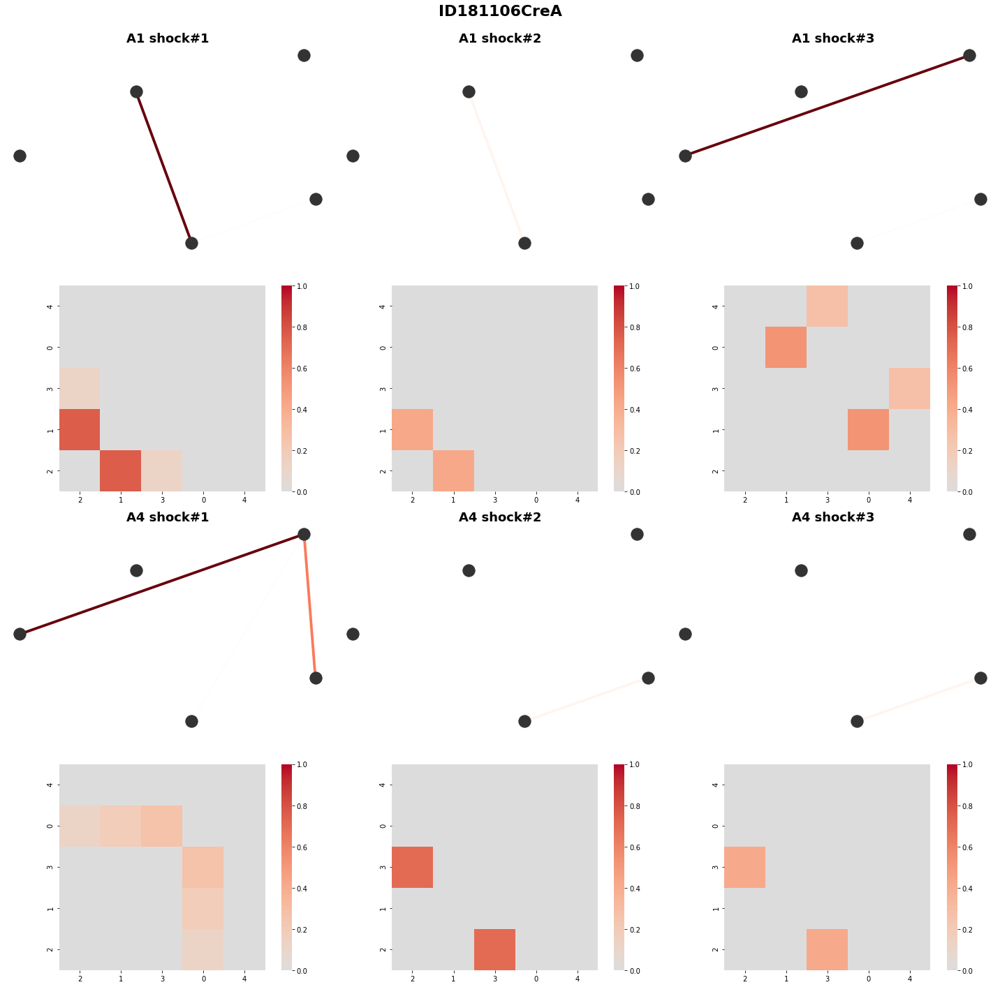

<Figure size 1440x1440 with 0 Axes>

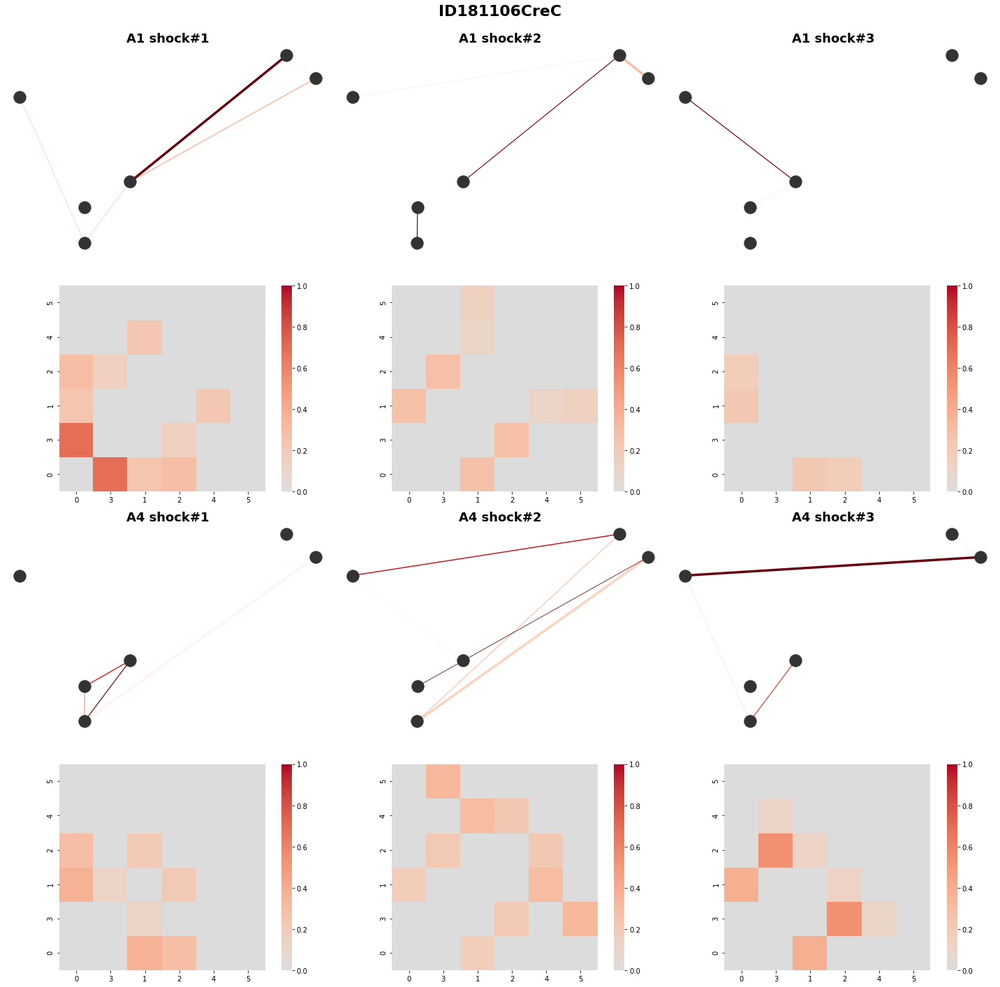

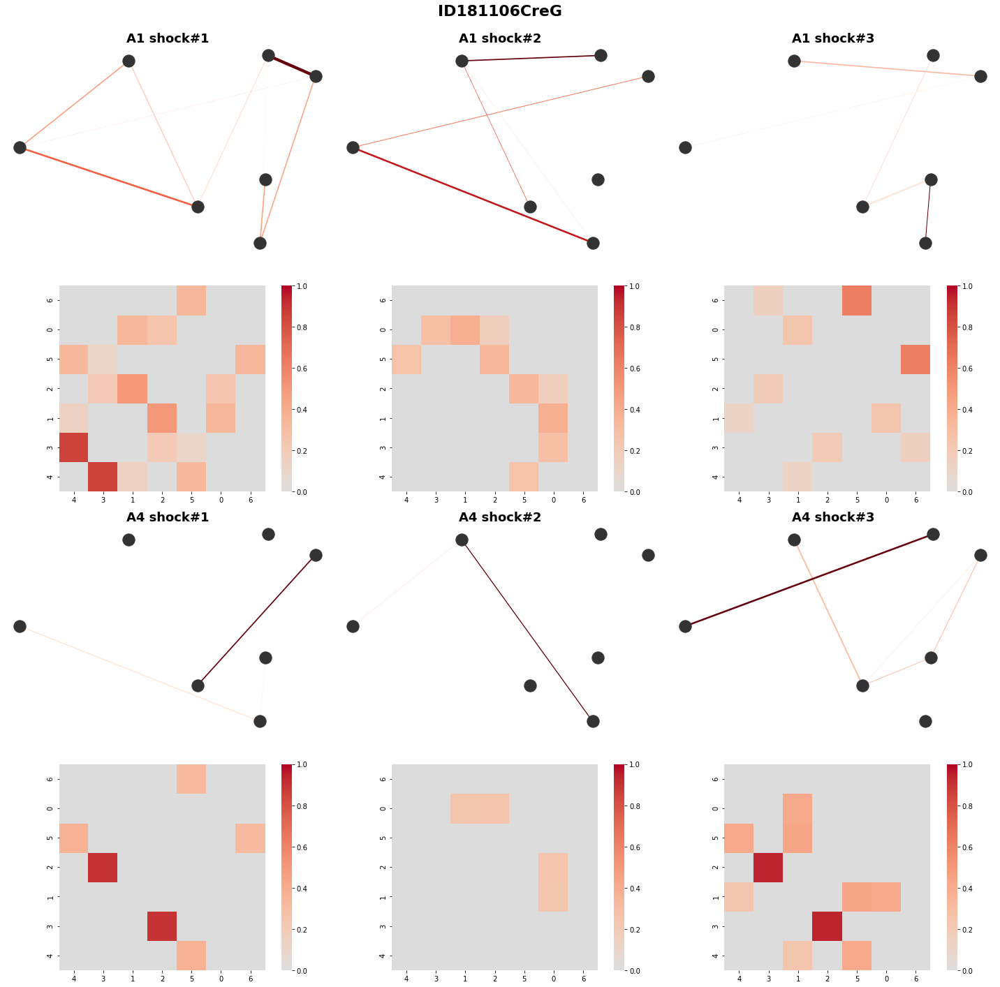

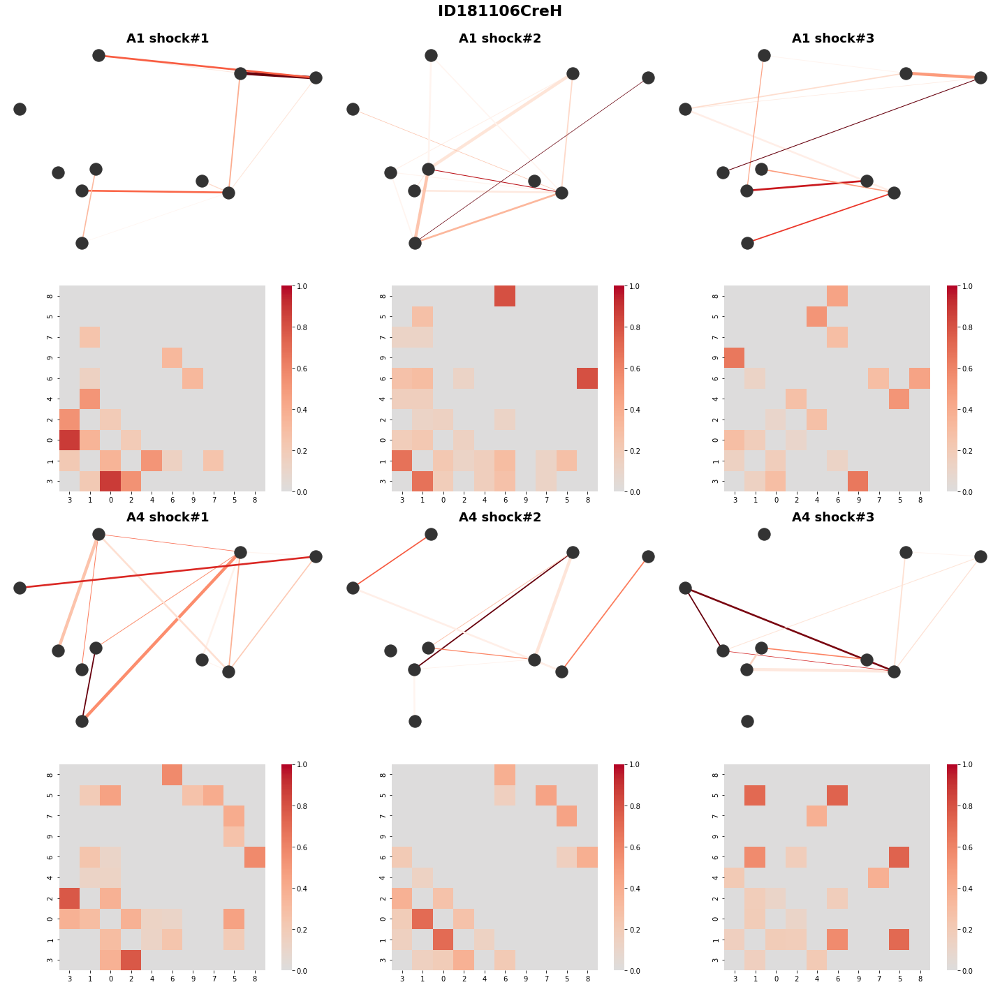

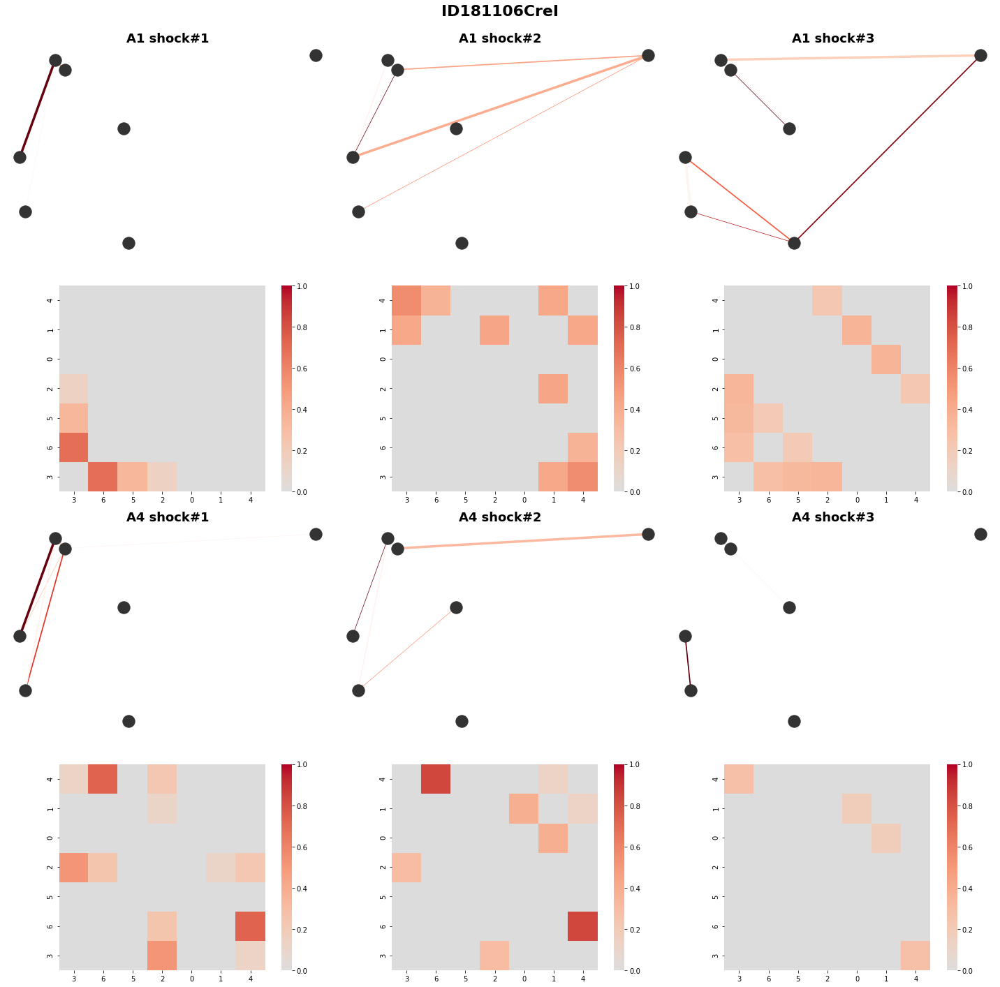

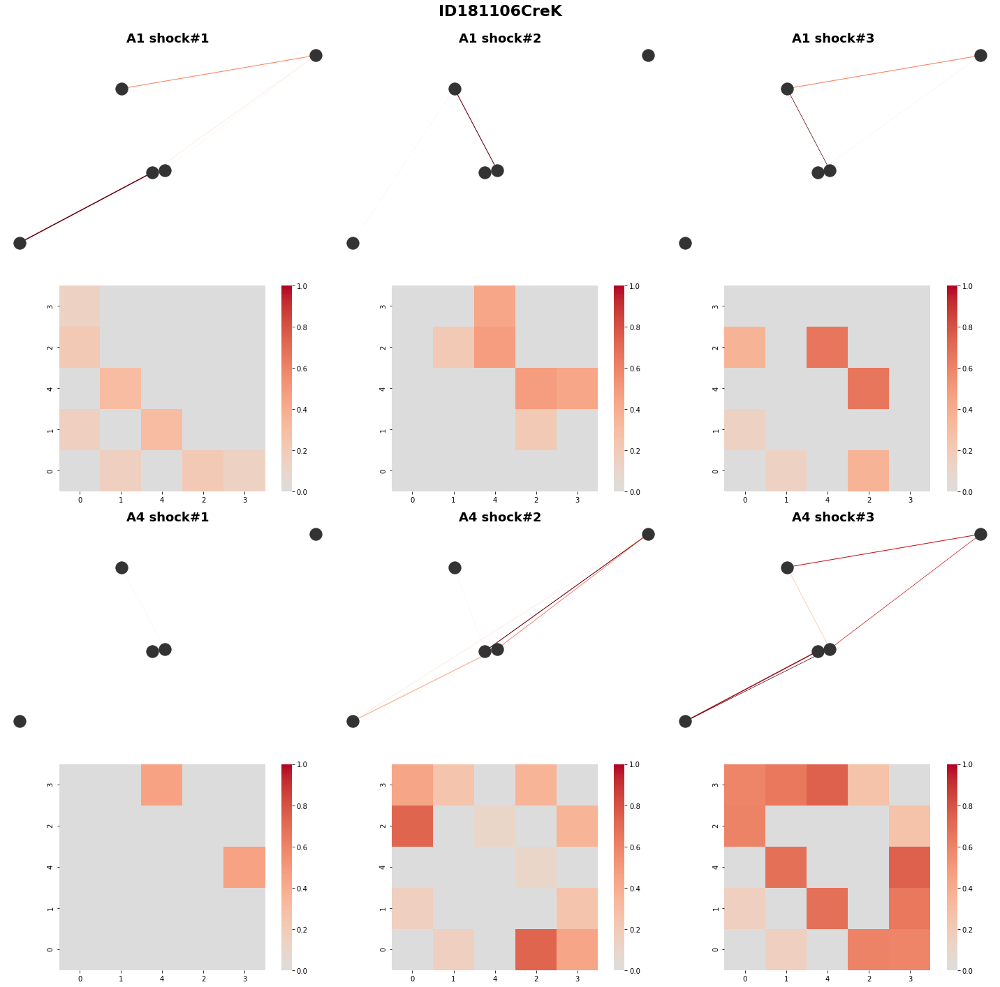

<Figure size 1440x1440 with 0 Axes>

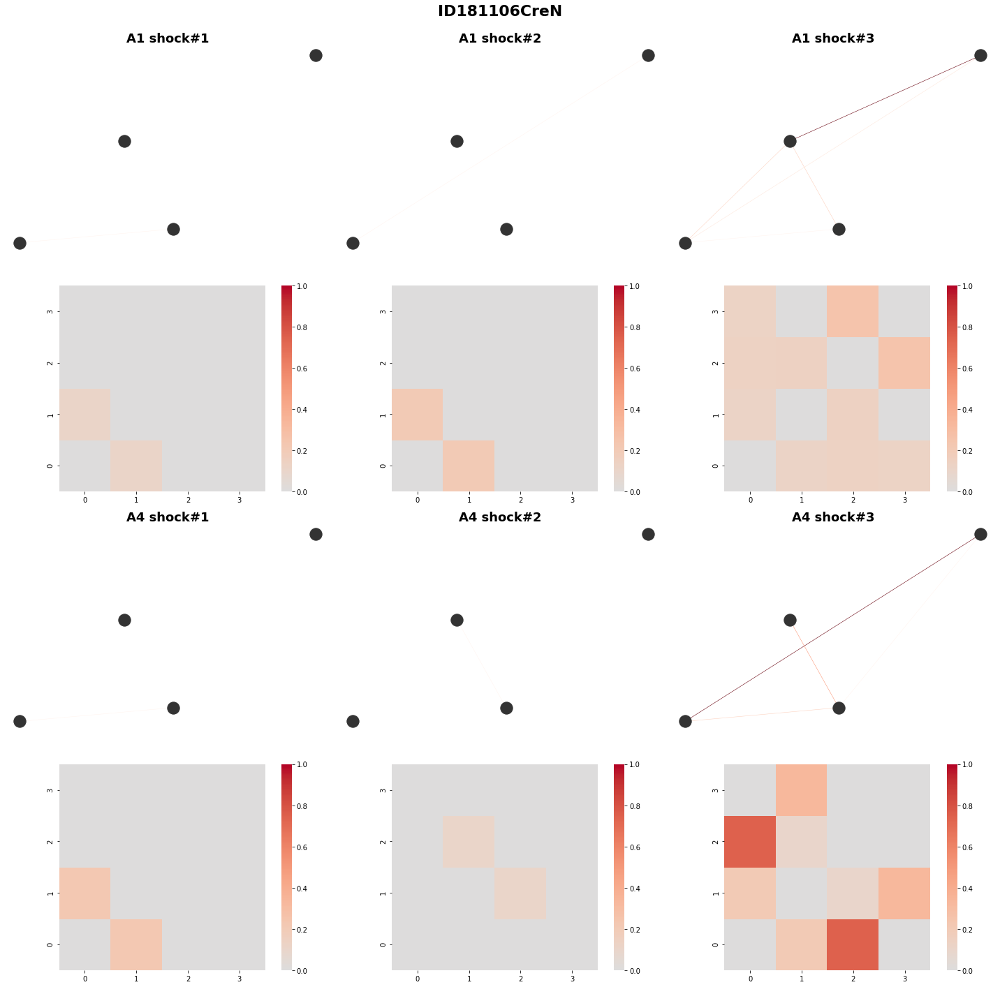

<Figure size 1440x1440 with 0 Axes>

In [5]:
for animal_name in const.ANIMAL_NAMES:
    try:
        print('animal name: %s' % animal_name)
        
        fig, axes = plt.subplots(ncols=3, nrows=4, figsize=(20, 20))
        
        shock_cells = engram_shock_cells[animal_name]
        
        a1_csv = ContextDataCSV(animal_name, 'A1postES')
        a1_matrix = MatrixOptimizer(a1_csv.data_frame).divide_sd()
        a1_shock_matrix = a1_matrix.loc[:, shock_cells]
        
        max_distances = []
        
        a1_preserved_spikes = {}
        a1_1_graph = calc_cofiring_graph(a1_shock_matrix, shock_cells, a1_preserved_spikes, 80, 100)
        a1_2_graph = calc_cofiring_graph(a1_shock_matrix, shock_cells, a1_preserved_spikes, 980, 1000)
        a1_3_graph = calc_cofiring_graph(a1_shock_matrix, shock_cells, a1_preserved_spikes, 1880, 1900)
        
        calc_features(animal_name, 'A1_1', a1_1_graph, engram_df)
        calc_features(animal_name, 'A1_2', a1_2_graph, engram_df)
        calc_features(animal_name, 'A1_3', a1_3_graph, engram_df)
        
        a4_csv = ContextDataCSV(animal_name, 'A4postES')
        a4_matrix = MatrixOptimizer(a4_csv.data_frame).divide_sd()
        a4_shock_matrix = a4_matrix.loc[:, shock_cells]
        
        a4_preserved_spikes = {}
        a4_1_graph = calc_cofiring_graph(a4_shock_matrix, shock_cells, a4_preserved_spikes, 80, 100)
        a4_2_graph = calc_cofiring_graph(a4_shock_matrix, shock_cells, a4_preserved_spikes, 980, 1000)
        a4_3_graph = calc_cofiring_graph(a4_shock_matrix, shock_cells, a4_preserved_spikes, 1880, 1900)
        
        calc_features(animal_name, 'A4_1', a4_1_graph, engram_df)
        calc_features(animal_name, 'A4_2', a4_2_graph, engram_df)
        calc_features(animal_name, 'A4_3', a4_3_graph, engram_df)
        
        a1_non_nan_cells = find_all_nan_cells(a1_matrix)
        a4_non_nan_cells = find_all_nan_cells(a4_matrix)
        all_nan_cells = dropped_unique_cells(a1_non_nan_cells, a4_non_nan_cells)
        
        a1_matrix.drop(columns=all_nan_cells, inplace=True)
        a4_matrix.drop(columns=all_nan_cells, inplace=True)
        
        correct_count = 0
        for _ in range(10000):
            try:
                all_cells = a1_matrix.columns
                random_cell_indice = np.random.randint(0, len(all_cells), size=len(shock_cells))
                random_cells = []
                for cell_index in random_cell_indice:
                    random_cells.append(all_cells[cell_index])
                
                a1_shuffle_shock_matrix = a1_matrix.loc[:, random_cells]
                a1_1_shuffle_graph = calc_cofiring_graph(a1_shuffle_shock_matrix, random_cells, a1_preserved_spikes, 80, 100)
                a1_2_shuffle_graph = calc_cofiring_graph(a1_shuffle_shock_matrix, random_cells, a1_preserved_spikes, 980, 1000)
                a1_3_shuffle_graph = calc_cofiring_graph(a1_shuffle_shock_matrix, random_cells, a1_preserved_spikes, 1880, 1900)
            
                calc_features(animal_name, 'A1_1', a1_1_shuffle_graph, non_engram_shuffle_df, is_assortativity=False)
                calc_features(animal_name, 'A1_2', a1_2_shuffle_graph, non_engram_shuffle_df, is_assortativity=False)
                calc_features(animal_name, 'A1_3', a1_3_shuffle_graph, non_engram_shuffle_df, is_assortativity=False)
                
                a4_shuffle_shock_matrix = a4_matrix.loc[:, random_cells]
                a4_1_shuffle_graph = calc_cofiring_graph(a4_shuffle_shock_matrix, random_cells, a4_preserved_spikes, 80, 100)
                a4_2_shuffle_graph = calc_cofiring_graph(a4_shuffle_shock_matrix, random_cells, a4_preserved_spikes, 980, 1000)
                a4_3_shuffle_graph = calc_cofiring_graph(a4_shuffle_shock_matrix, random_cells, a4_preserved_spikes, 1880, 1900)
            
                calc_features(animal_name, 'A4_1', a4_1_shuffle_graph, non_engram_shuffle_df, is_assortativity=False)
                calc_features(animal_name, 'A4_2', a4_2_shuffle_graph, non_engram_shuffle_df, is_assortativity=False)
                calc_features(animal_name, 'A4_3', a4_3_shuffle_graph, non_engram_shuffle_df, is_assortativity=False)
                
                correct_count += 1
            except Exception as e:
                continue
                
        print('correct count is %d' % correct_count)
        
        average_features(animal_name, 'A1_1', non_engram_shuffle_df, correct_count, is_assortativity=False)
        average_features(animal_name, 'A1_2', non_engram_shuffle_df, correct_count, is_assortativity=False)
        average_features(animal_name, 'A1_3', non_engram_shuffle_df, correct_count, is_assortativity=False)
        average_features(animal_name, 'A4_1', non_engram_shuffle_df, correct_count, is_assortativity=False)
        average_features(animal_name, 'A4_2', non_engram_shuffle_df, correct_count, is_assortativity=False)
        average_features(animal_name, 'A4_3', non_engram_shuffle_df, correct_count, is_assortativity=False)
            
        pos = nx.random_layout(a1_1_graph)
        
        adjacency_matrixes = []
        
        a1_1_edges, a1_1_weights = zip(*nx.get_edge_attributes(a1_1_graph, 'weight').items())
        nx.draw(a1_1_graph, pos, node_color='0.2', edgelist=a1_1_edges, edge_color=a1_1_weights, width=(np.array(a1_1_weights) * 5), edge_cmap=plt.cm.Reds, ax=axes[0][0])
        axes[0][0].set_title('A1 shock#1', fontsize=18, fontweight='bold')
        
        a1_1_adjacency_matrix = pd.DataFrame(nx.adjacency_matrix(a1_1_graph).toarray())
        adjacency_matrixes.append(a1_1_adjacency_matrix.copy(deep=True))
        ordered_high_weight_index = a1_1_adjacency_matrix.sum().sort_values(ascending=False).index
        a1_1_adjacency_matrix = a1_1_adjacency_matrix.reindex(index=ordered_high_weight_index, columns=ordered_high_weight_index, copy=True)
        
        ax = sns.heatmap(a1_1_adjacency_matrix, square=True, cmap='coolwarm', center=0.0, ax=axes[1][0], vmin=0.0, vmax=1.0)
        ax.invert_yaxis()
        
        a1_2_edges, a1_2_weights = zip(*nx.get_edge_attributes(a1_2_graph, 'weight').items())
        nx.draw(a1_2_graph, pos, node_color='0.2', edgelist=a1_2_edges, edge_color=a1_2_weights, width=(np.array(a1_1_weights) * 5), edge_cmap=plt.cm.Reds, ax=axes[0][1])
        axes[0][1].set_title('A1 shock#2', fontsize=18, fontweight='bold')
        
        a1_2_adjacency_matrix = pd.DataFrame(nx.adjacency_matrix(a1_2_graph).toarray())
        adjacency_matrixes.append(a1_2_adjacency_matrix.copy(deep=True))
        a1_2_adjacency_matrix = a1_2_adjacency_matrix.reindex(index=ordered_high_weight_index, columns=ordered_high_weight_index, copy=True)
        
        ax = sns.heatmap(a1_2_adjacency_matrix, square=True, cmap='coolwarm', center=0.0, ax=axes[1][1], vmin=0.0, vmax=1.0)
        ax.invert_yaxis()
        
        a1_3_edges, a1_3_weights = zip(*nx.get_edge_attributes(a1_3_graph, 'weight').items())
        nx.draw(a1_3_graph, pos, node_color='0.2', edgelist=a1_3_edges, edge_color=a1_3_weights, width=(np.array(a1_1_weights) * 5), edge_cmap=plt.cm.Reds, ax=axes[0][2])
        axes[0][2].set_title('A1 shock#3', fontsize=18, fontweight='bold')
        
        a1_3_adjacency_matrix = pd.DataFrame(nx.adjacency_matrix(a1_3_graph).toarray())
        adjacency_matrixes.append(a1_3_adjacency_matrix.copy(deep=True))
        a1_3_adjacency_matrix = a1_3_adjacency_matrix.reindex(index=ordered_high_weight_index, columns=ordered_high_weight_index, copy=True)
        
        ax = sns.heatmap(a1_3_adjacency_matrix, square=True, cmap='coolwarm', center=0.0, ax=axes[1][2], vmin=0.0, vmax=1.0)
        ax.invert_yaxis()
        
        a4_1_edges, a4_1_weights = zip(*nx.get_edge_attributes(a4_1_graph, 'weight').items())
        nx.draw(a4_1_graph, pos, node_color='0.2', edgelist=a4_1_edges, edge_color=a4_1_weights, width=(np.array(a1_1_weights) * 5), edge_cmap=plt.cm.Reds, ax=axes[2][0])
        axes[2][0].set_title('A4 shock#1', fontsize=18, fontweight='bold')
        
        a4_1_adjacency_matrix = pd.DataFrame(nx.adjacency_matrix(a4_1_graph).toarray())
        adjacency_matrixes.append(a4_1_adjacency_matrix.copy(deep=True))
        a4_1_adjacency_matrix = a4_1_adjacency_matrix.reindex(index=ordered_high_weight_index, columns=ordered_high_weight_index, copy=True)
        
        ax = sns.heatmap(a4_1_adjacency_matrix, square=True, cmap='coolwarm', center=0.0, ax=axes[3][0], vmin=0.0, vmax=1.0)
        ax.invert_yaxis()
        
        a4_2_edges, a4_2_weights = zip(*nx.get_edge_attributes(a4_2_graph, 'weight').items())
        nx.draw(a4_2_graph, pos, node_color='0.2', edgelist=a4_2_edges, edge_color=a4_2_weights, width=(np.array(a1_1_weights) * 5), edge_cmap=plt.cm.Reds, ax=axes[2][1])
        axes[2][1].set_title('A4 shock#2', fontsize=18, fontweight='bold')
        
        a4_2_adjacency_matrix = pd.DataFrame(nx.adjacency_matrix(a4_2_graph).toarray())
        adjacency_matrixes.append(a4_2_adjacency_matrix.copy(deep=True))
        a4_2_adjacency_matrix = a4_2_adjacency_matrix.reindex(index=ordered_high_weight_index, columns=ordered_high_weight_index, copy=True)
        
        ax = sns.heatmap(a4_2_adjacency_matrix, square=True, cmap='coolwarm', center=0.0, ax=axes[3][1], vmin=0.0, vmax=1.0)
        ax.invert_yaxis()
        
        a4_3_edges, a4_3_weights = zip(*nx.get_edge_attributes(a4_3_graph, 'weight').items())
        nx.draw(a4_3_graph, pos, node_color='0.2', edgelist=a4_3_edges, edge_color=a4_3_weights, width=(np.array(a1_1_weights) * 5), edge_cmap=plt.cm.Reds, ax=axes[2][2])
        axes[2][2].set_title('A4 shock#3', fontsize=18, fontweight='bold')
        
        a4_3_adjacency_matrix = pd.DataFrame(nx.adjacency_matrix(a4_3_graph).toarray())
        adjacency_matrixes.append(a4_3_adjacency_matrix.copy(deep=True))
        a4_3_adjacency_matrix = a4_3_adjacency_matrix.reindex(index=ordered_high_weight_index, columns=ordered_high_weight_index, copy=True)
        ax = sns.heatmap(a4_3_adjacency_matrix, square=True, cmap='coolwarm', center=0.0, ax=axes[3][2], vmin=0.0, vmax=1.0)
        ax.invert_yaxis()
        
        fig.tight_layout(rect=[0, 0, 1, 0.96])
        fig.suptitle(animal_name, fontsize=22, fontweight='bold')
        fig.show()
    except Exception as e:
        print(e)
        fig.clear()

animal name: ID181106CreA
correct count is 9963
animal name: ID181106CreB
correct count is 9949
animal name: ID181106CreC
correct count is 9928
animal name: ID181106CreG
correct count is 9932
animal name: ID181106CreH
correct count is 9969
animal name: ID181106CreI
correct count is 9993
animal name: ID181106CreK
correct count is 9948
animal name: ID181106CreL
correct count is 9927
animal name: ID181106CreN
correct count is 9932
animal name: ID181106CreQ
correct count is 9898


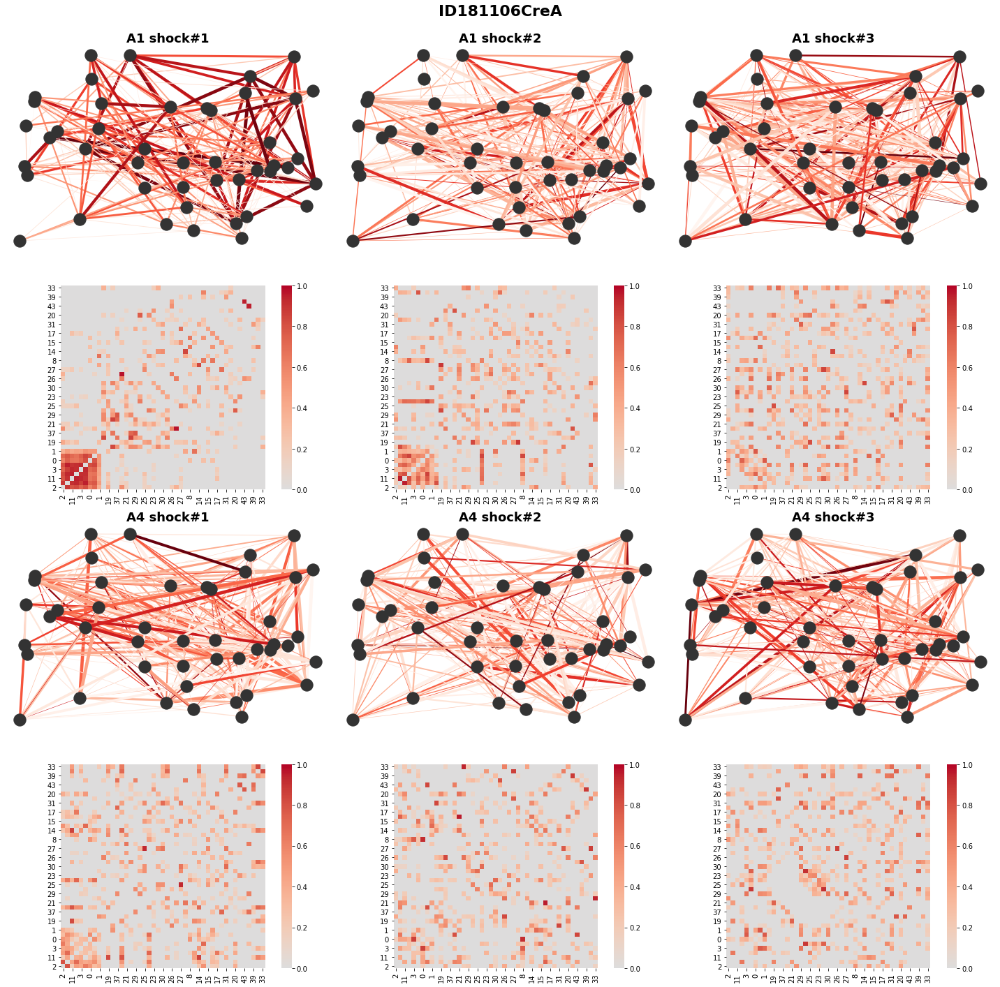

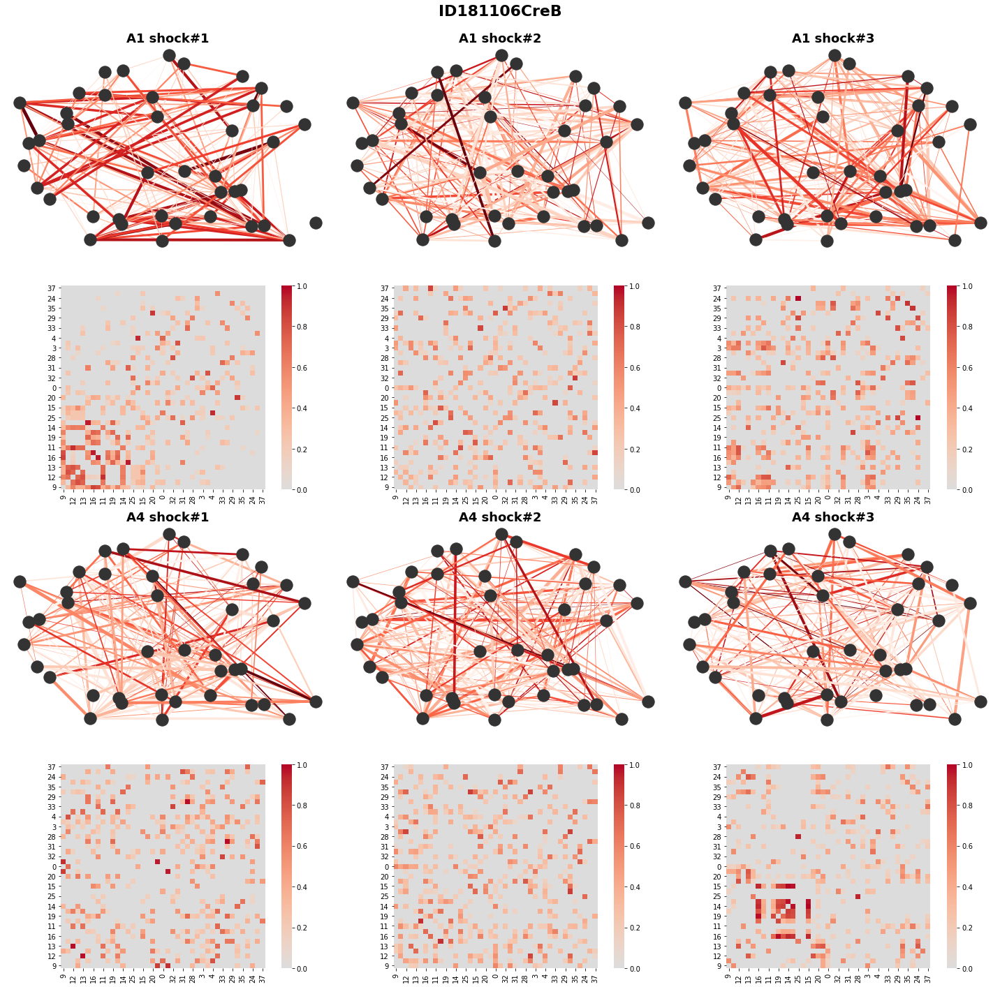

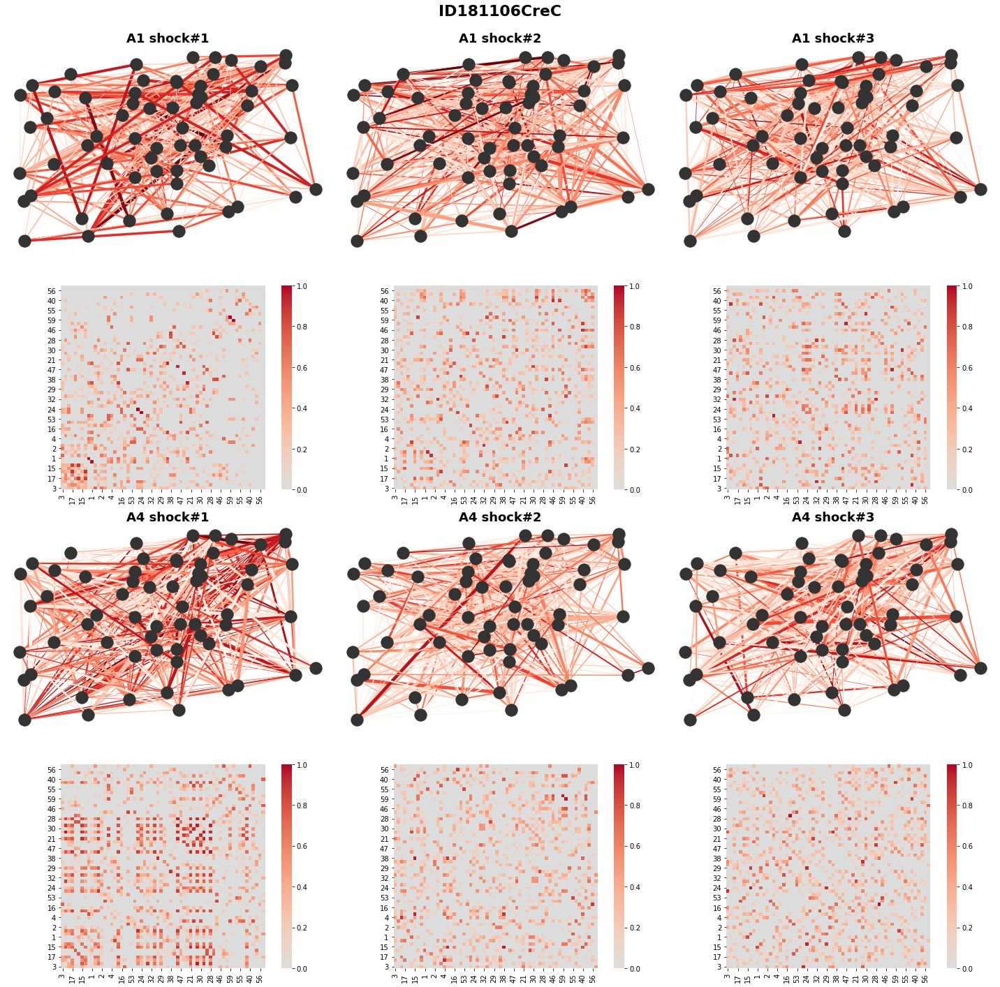

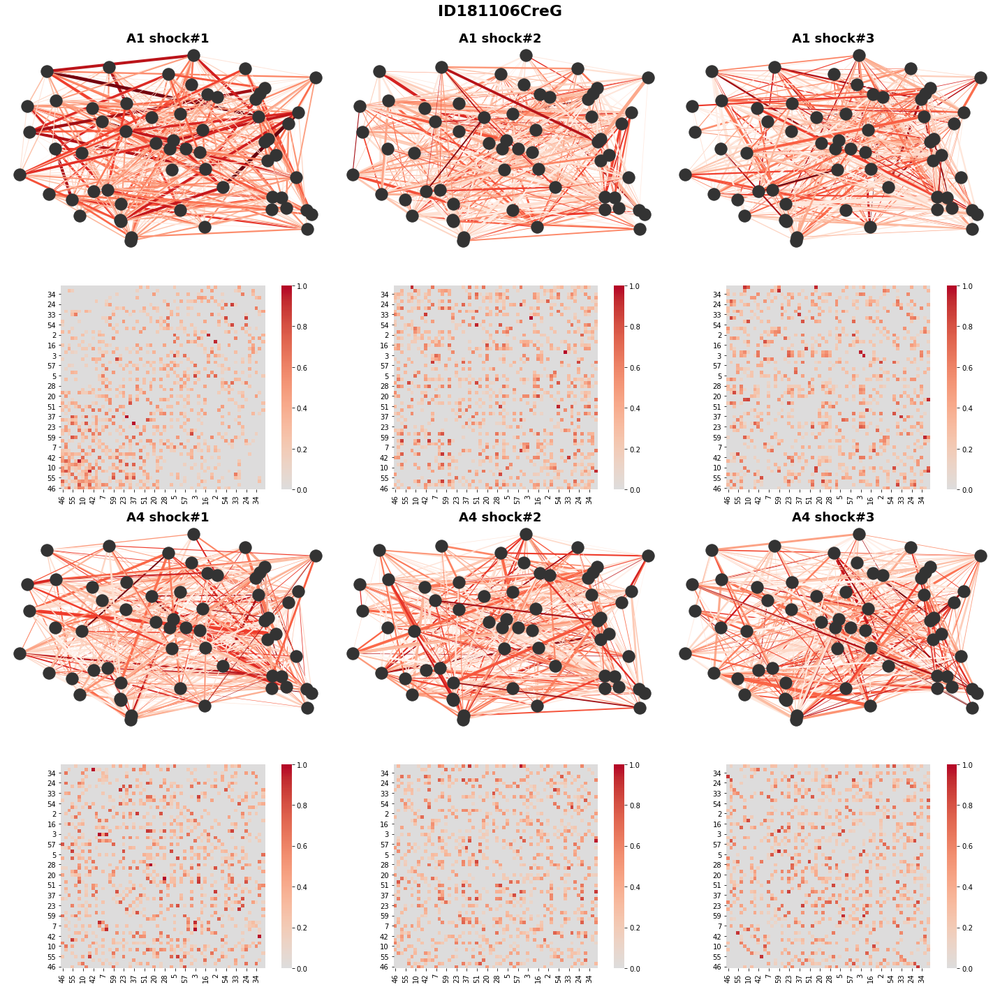

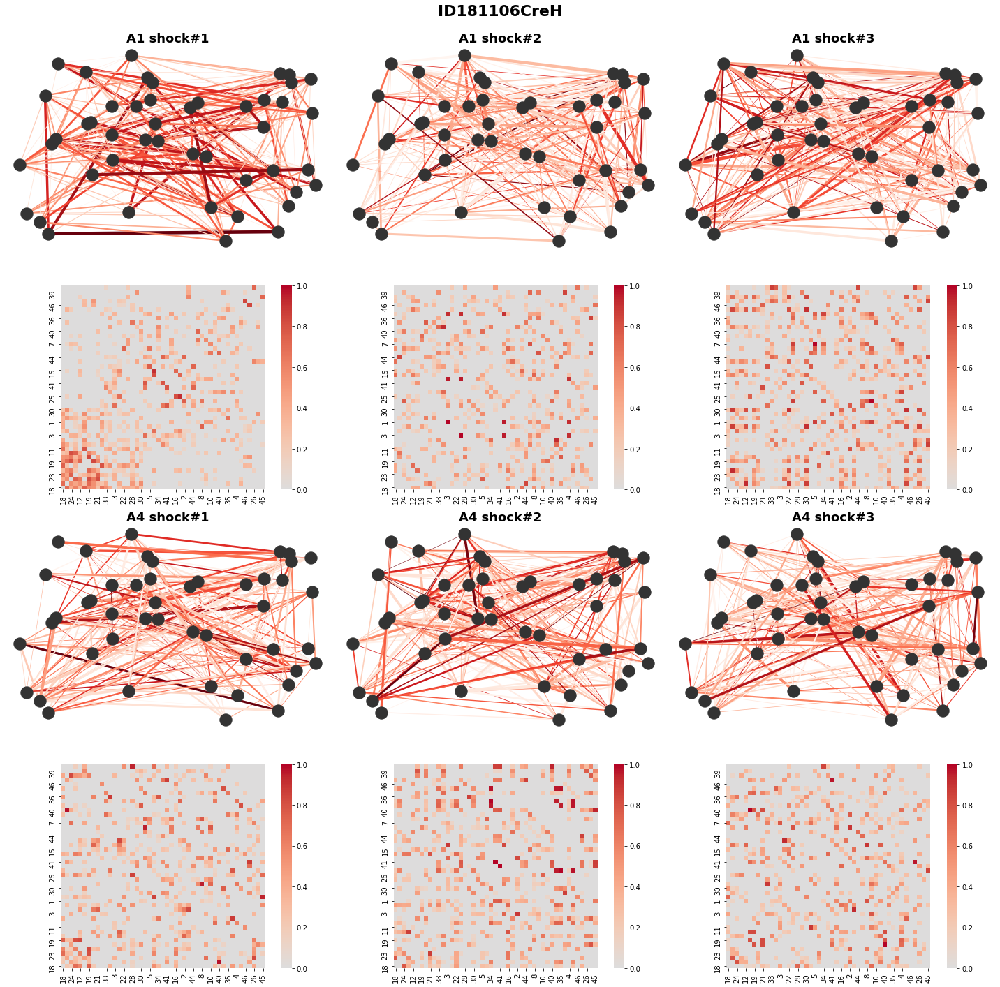

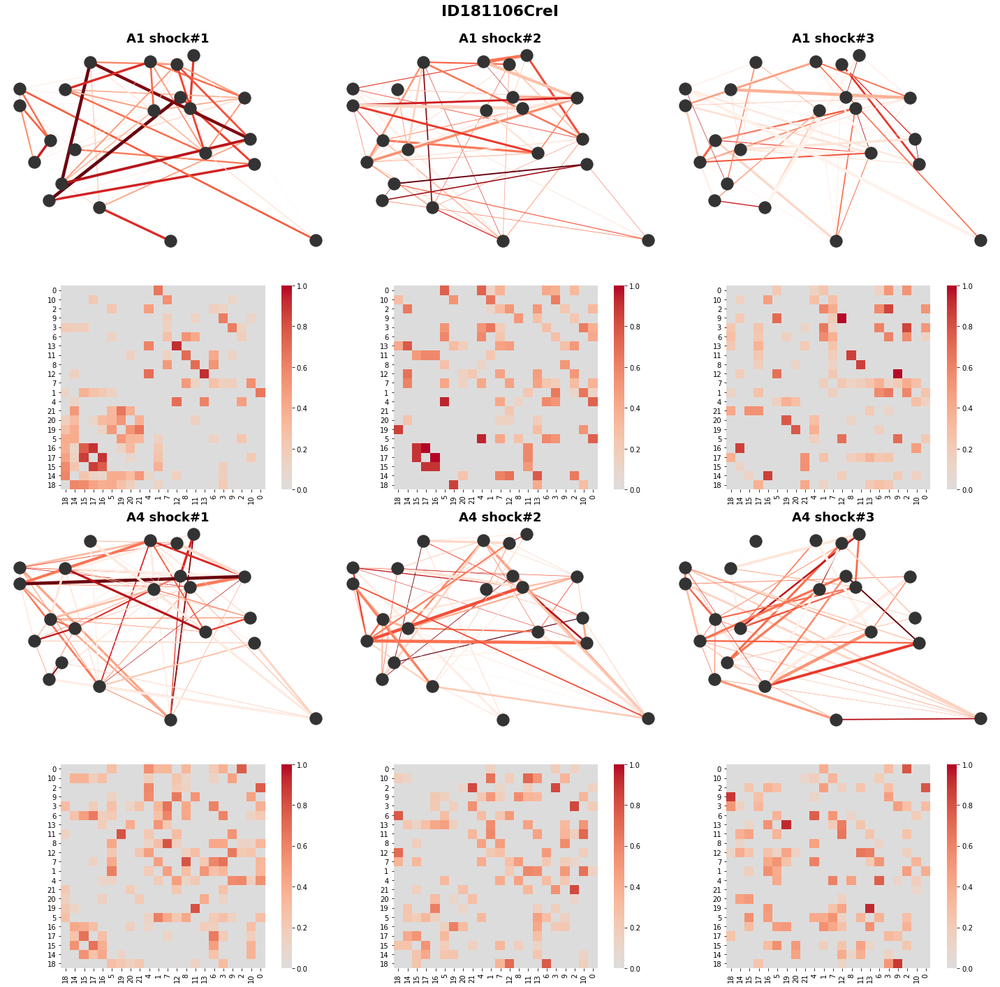

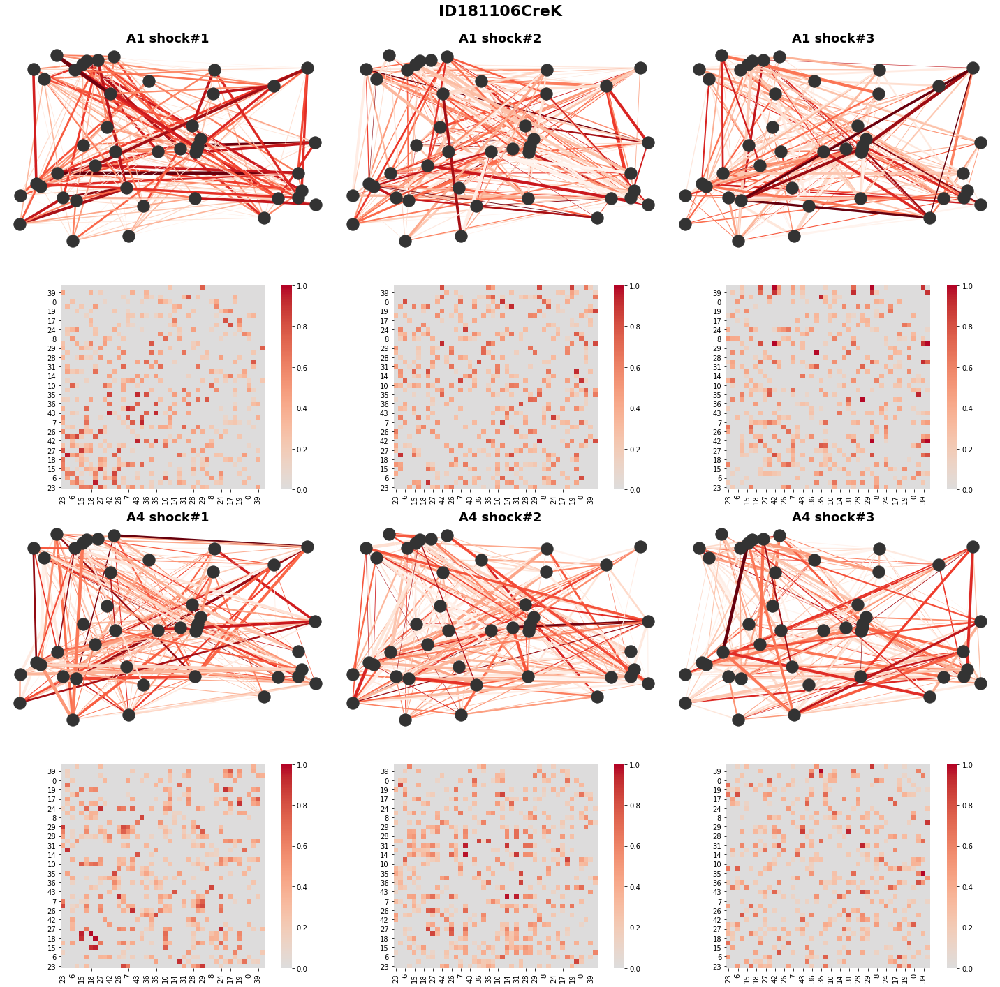

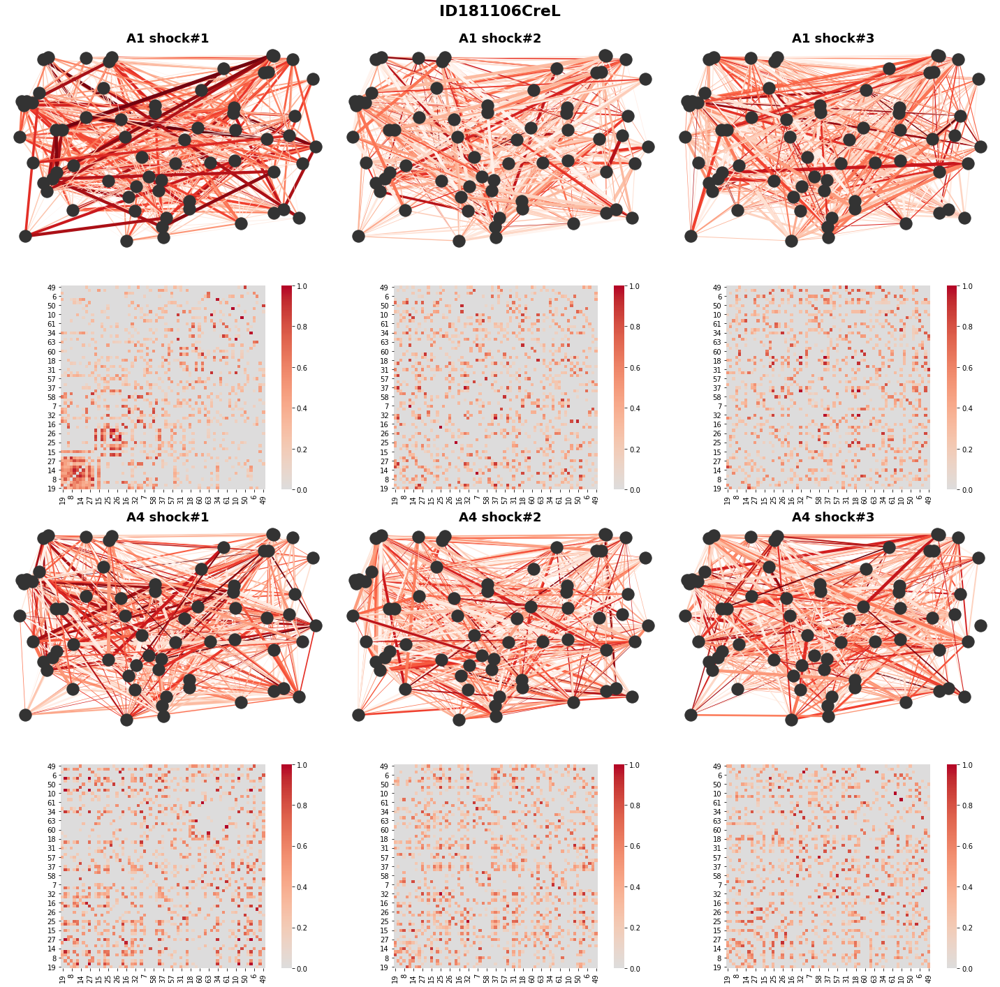

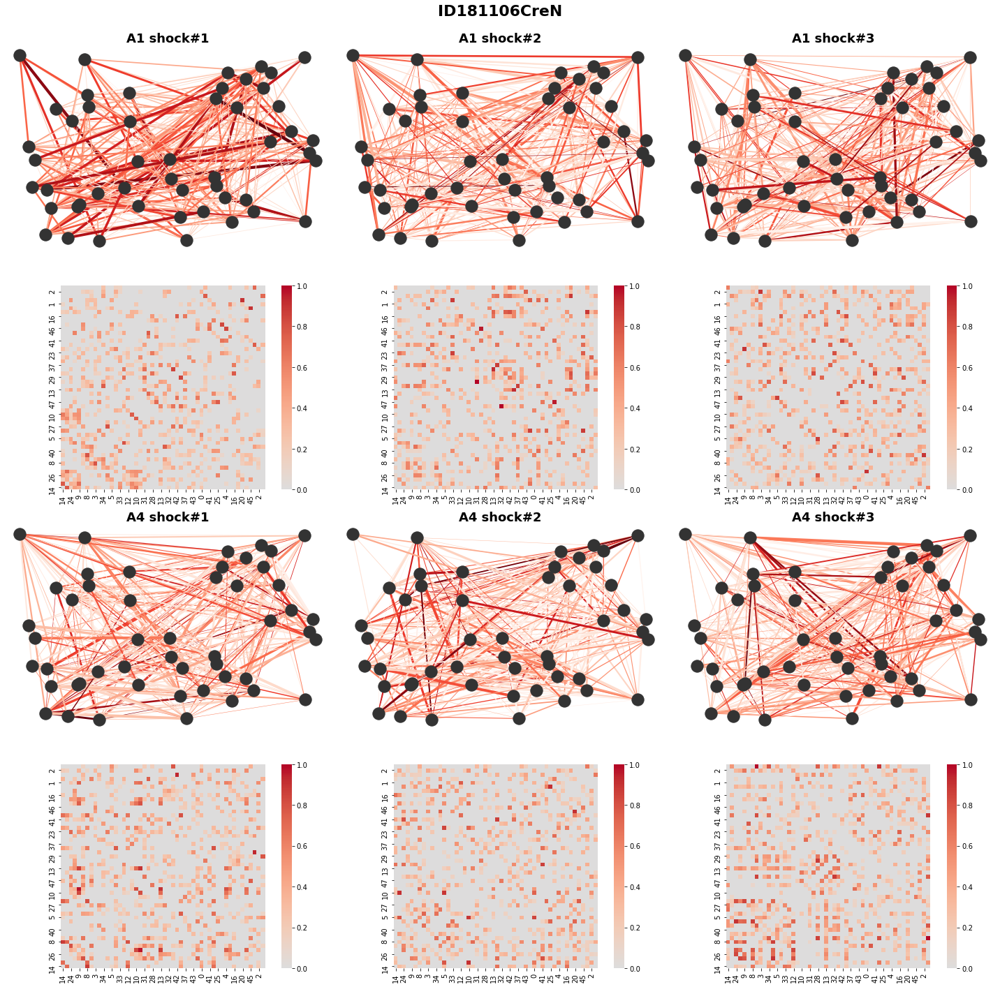

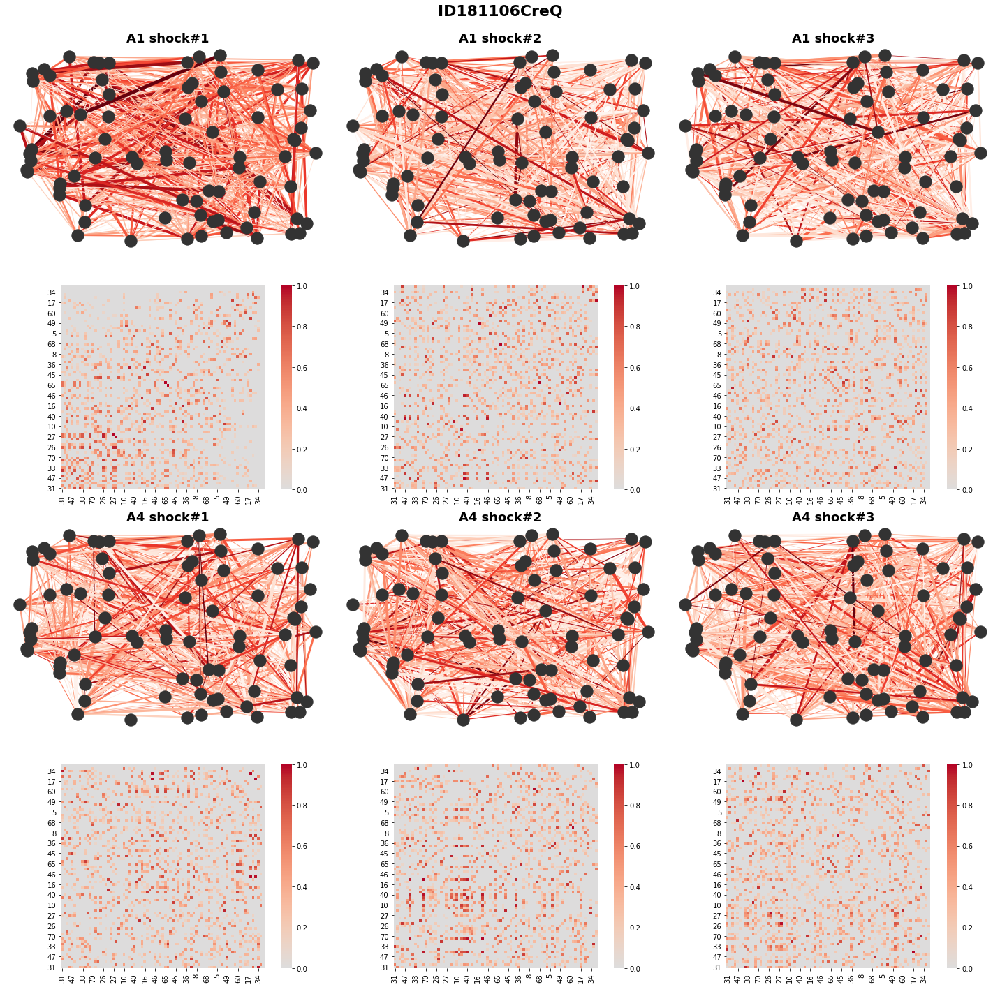

In [7]:
for animal_name in const.ANIMAL_NAMES:
    try:
        print('animal name: %s' % animal_name)
        
        fig, axes = plt.subplots(ncols=3, nrows=4, figsize=(20, 20))
        
        shock_cells = non_engram_shock_cells[animal_name]
        
        a1_csv = ContextDataCSV(animal_name, 'A1postES')
        a1_matrix = MatrixOptimizer(a1_csv.data_frame).divide_sd()
        a1_shock_matrix = a1_matrix.loc[:, shock_cells]
        
        a1_preserved_spikes = {}
        a1_1_graph = calc_cofiring_graph(a1_shock_matrix, shock_cells, a1_preserved_spikes, 80, 100)
        a1_2_graph = calc_cofiring_graph(a1_shock_matrix, shock_cells, a1_preserved_spikes, 980, 1000)
        a1_3_graph = calc_cofiring_graph(a1_shock_matrix, shock_cells, a1_preserved_spikes, 1880, 1900)
        
        calc_features(animal_name, 'A1_1', a1_1_graph, non_engram_df)
        calc_features(animal_name, 'A1_2', a1_2_graph, non_engram_df)
        calc_features(animal_name, 'A1_3', a1_3_graph, non_engram_df)
        
        a4_csv = ContextDataCSV(animal_name, 'A4postES')
        a4_matrix = MatrixOptimizer(a4_csv.data_frame).divide_sd()
        a4_shock_matrix = a4_matrix.loc[:, shock_cells]
        
        a4_preserved_spikes = {}
        a4_1_graph = calc_cofiring_graph(a4_shock_matrix, shock_cells, a4_preserved_spikes, 80, 100)
        a4_2_graph = calc_cofiring_graph(a4_shock_matrix, shock_cells, a4_preserved_spikes, 980, 1000)
        a4_3_graph = calc_cofiring_graph(a4_shock_matrix, shock_cells, a4_preserved_spikes, 1880, 1900)
        
        calc_features(animal_name, 'A4_1', a4_1_graph, non_engram_df)
        calc_features(animal_name, 'A4_2', a4_2_graph, non_engram_df)
        calc_features(animal_name, 'A4_3', a4_3_graph, non_engram_df)
        
        a1_non_nan_cells = find_all_nan_cells(a1_matrix)
        a4_non_nan_cells = find_all_nan_cells(a4_matrix)
        all_nan_cells = dropped_unique_cells(a1_non_nan_cells, a4_non_nan_cells)
        
        a1_matrix.drop(columns=all_nan_cells, inplace=True)
        a4_matrix.drop(columns=all_nan_cells, inplace=True)
        
        correct_count = 0
        for _ in range(10000):
            try:
                all_cells = a1_matrix.columns
                random_cell_indice = np.random.randint(0, len(all_cells), size=len(shock_cells))
                random_cells = []
                for cell_index in random_cell_indice:
                    random_cells.append(all_cells[cell_index])
                
                a1_shuffle_shock_matrix = a1_matrix.loc[:, random_cells]
                a1_1_shuffle_graph = calc_cofiring_graph(a1_shuffle_shock_matrix, random_cells, a1_preserved_spikes, 80, 100)
                a1_2_shuffle_graph = calc_cofiring_graph(a1_shuffle_shock_matrix, random_cells, a1_preserved_spikes, 980, 1000)
                a1_3_shuffle_graph = calc_cofiring_graph(a1_shuffle_shock_matrix, random_cells, a1_preserved_spikes, 1880, 1900)
            
                calc_features(animal_name, 'A1_1', a1_1_shuffle_graph, engram_shuffle_df, is_assortativity=False)
                calc_features(animal_name, 'A1_2', a1_2_shuffle_graph, engram_shuffle_df, is_assortativity=False)
                calc_features(animal_name, 'A1_3', a1_3_shuffle_graph, engram_shuffle_df, is_assortativity=False)
                
                a4_shuffle_shock_matrix = a4_matrix.loc[:, random_cells]
                a4_1_shuffle_graph = calc_cofiring_graph(a4_shuffle_shock_matrix, random_cells, a4_preserved_spikes, 80, 100)
                a4_2_shuffle_graph = calc_cofiring_graph(a4_shuffle_shock_matrix, random_cells, a4_preserved_spikes, 980, 1000)
                a4_3_shuffle_graph = calc_cofiring_graph(a4_shuffle_shock_matrix, random_cells, a4_preserved_spikes, 1880, 1900)
            
                calc_features(animal_name, 'A4_1', a4_1_shuffle_graph, engram_shuffle_df, is_assortativity=False)
                calc_features(animal_name, 'A4_2', a4_2_shuffle_graph, engram_shuffle_df, is_assortativity=False)
                calc_features(animal_name, 'A4_3', a4_3_shuffle_graph, engram_shuffle_df, is_assortativity=False)
                
                correct_count += 1
            except Exception as e:
                continue
                
        print('correct count is %d' % correct_count)
        
        average_features(animal_name, 'A1_1', engram_shuffle_df, correct_count, is_assortativity=False)
        average_features(animal_name, 'A1_2', engram_shuffle_df, correct_count, is_assortativity=False)
        average_features(animal_name, 'A1_3', engram_shuffle_df, correct_count, is_assortativity=False)
        average_features(animal_name, 'A4_1', engram_shuffle_df, correct_count, is_assortativity=False)
        average_features(animal_name, 'A4_2', engram_shuffle_df, correct_count, is_assortativity=False)
        average_features(animal_name, 'A4_3', engram_shuffle_df, correct_count, is_assortativity=False)
        
        pos = nx.random_layout(a1_1_graph)
        
        adjacency_matrixes = []
        
        a1_1_edges, a1_1_weights = zip(*nx.get_edge_attributes(a1_1_graph, 'weight').items())
        nx.draw(a1_1_graph, pos, node_color='0.2', edgelist=a1_1_edges, edge_color=a1_1_weights, width=(np.array(a1_1_weights) * 5), edge_cmap=plt.cm.Reds, ax=axes[0][0])
        axes[0][0].set_title('A1 shock#1', fontsize=18, fontweight='bold')
        
        a1_1_adjacency_matrix = pd.DataFrame(nx.adjacency_matrix(a1_1_graph).toarray())
        adjacency_matrixes.append(a1_1_adjacency_matrix.copy(deep=True))
        ordered_high_weight_index = a1_1_adjacency_matrix.sum().sort_values(ascending=False).index
        a1_1_adjacency_matrix = a1_1_adjacency_matrix.reindex(index=ordered_high_weight_index, columns=ordered_high_weight_index, copy=True)
        
        ax = sns.heatmap(a1_1_adjacency_matrix, square=True, cmap='coolwarm', center=0.0, ax=axes[1][0], vmin=0.0, vmax=1.0)
        ax.invert_yaxis()
        
        a1_2_edges, a1_2_weights = zip(*nx.get_edge_attributes(a1_2_graph, 'weight').items())
        nx.draw(a1_2_graph, pos, node_color='0.2', edgelist=a1_2_edges, edge_color=a1_2_weights, width=(np.array(a1_1_weights) * 5), edge_cmap=plt.cm.Reds, ax=axes[0][1])
        axes[0][1].set_title('A1 shock#2', fontsize=18, fontweight='bold')
        
        a1_2_adjacency_matrix = pd.DataFrame(nx.adjacency_matrix(a1_2_graph).toarray())
        adjacency_matrixes.append(a1_2_adjacency_matrix.copy(deep=True))
        a1_2_adjacency_matrix = a1_2_adjacency_matrix.reindex(index=ordered_high_weight_index, columns=ordered_high_weight_index, copy=True)
        
        ax = sns.heatmap(a1_2_adjacency_matrix, square=True, cmap='coolwarm', center=0.0, ax=axes[1][1], vmin=0.0, vmax=1.0)
        ax.invert_yaxis()
        
        a1_3_edges, a1_3_weights = zip(*nx.get_edge_attributes(a1_3_graph, 'weight').items())
        nx.draw(a1_3_graph, pos, node_color='0.2', edgelist=a1_3_edges, edge_color=a1_3_weights, width=(np.array(a1_1_weights) * 5), edge_cmap=plt.cm.Reds, ax=axes[0][2])
        axes[0][2].set_title('A1 shock#3', fontsize=18, fontweight='bold')
        
        a1_3_adjacency_matrix = pd.DataFrame(nx.adjacency_matrix(a1_3_graph).toarray())
        adjacency_matrixes.append(a1_3_adjacency_matrix.copy(deep=True))
        a1_3_adjacency_matrix = a1_3_adjacency_matrix.reindex(index=ordered_high_weight_index, columns=ordered_high_weight_index, copy=True)
        
        ax = sns.heatmap(a1_3_adjacency_matrix, square=True, cmap='coolwarm', center=0.0, ax=axes[1][2], vmin=0.0, vmax=1.0)
        ax.invert_yaxis()
        
        a4_1_edges, a4_1_weights = zip(*nx.get_edge_attributes(a4_1_graph, 'weight').items())
        nx.draw(a4_1_graph, pos, node_color='0.2', edgelist=a4_1_edges, edge_color=a4_1_weights, width=(np.array(a1_1_weights) * 5), edge_cmap=plt.cm.Reds, ax=axes[2][0])
        axes[2][0].set_title('A4 shock#1', fontsize=18, fontweight='bold')
        
        a4_1_adjacency_matrix = pd.DataFrame(nx.adjacency_matrix(a4_1_graph).toarray())
        adjacency_matrixes.append(a4_1_adjacency_matrix.copy(deep=True))
        a4_1_adjacency_matrix = a4_1_adjacency_matrix.reindex(index=ordered_high_weight_index, columns=ordered_high_weight_index, copy=True)
        
        ax = sns.heatmap(a4_1_adjacency_matrix, square=True, cmap='coolwarm', center=0.0, ax=axes[3][0], vmin=0.0, vmax=1.0)
        ax.invert_yaxis()
        
        a4_2_edges, a4_2_weights = zip(*nx.get_edge_attributes(a4_2_graph, 'weight').items())
        nx.draw(a4_2_graph, pos, node_color='0.2', edgelist=a4_2_edges, edge_color=a4_2_weights, width=(np.array(a1_1_weights) * 5), edge_cmap=plt.cm.Reds, ax=axes[2][1])
        axes[2][1].set_title('A4 shock#2', fontsize=18, fontweight='bold')
        
        a4_2_adjacency_matrix = pd.DataFrame(nx.adjacency_matrix(a4_2_graph).toarray())
        adjacency_matrixes.append(a4_2_adjacency_matrix.copy(deep=True))
        a4_2_adjacency_matrix = a4_2_adjacency_matrix.reindex(index=ordered_high_weight_index, columns=ordered_high_weight_index, copy=True)
        
        ax = sns.heatmap(a4_2_adjacency_matrix, square=True, cmap='coolwarm', center=0.0, ax=axes[3][1], vmin=0.0, vmax=1.0)
        ax.invert_yaxis()
        
        a4_3_edges, a4_3_weights = zip(*nx.get_edge_attributes(a4_3_graph, 'weight').items())
        nx.draw(a4_3_graph, pos, node_color='0.2', edgelist=a4_3_edges, edge_color=a4_3_weights, width=(np.array(a1_1_weights) * 5), edge_cmap=plt.cm.Reds, ax=axes[2][2])
        axes[2][2].set_title('A4 shock#3', fontsize=18, fontweight='bold')
        
        a4_3_adjacency_matrix = pd.DataFrame(nx.adjacency_matrix(a4_3_graph).toarray())
        adjacency_matrixes.append(a4_3_adjacency_matrix.copy(deep=True))
        a4_3_adjacency_matrix = a4_3_adjacency_matrix.reindex(index=ordered_high_weight_index, columns=ordered_high_weight_index, copy=True)
        ax = sns.heatmap(a4_3_adjacency_matrix, square=True, cmap='coolwarm', center=0.0, ax=axes[3][2], vmin=0.0, vmax=1.0)
        ax.invert_yaxis()
        
        fig.tight_layout(rect=[0, 0, 1, 0.96])
        fig.suptitle(animal_name, fontsize=22, fontweight='bold')
        fig.show()
    except Exception as e:
        print(e)
        fig.clear()

In [8]:
engram_df

context                        A1_1                                          \
feature      clustering coefficient shortest path length co-firing strength   
ID181106CreA               0.000000             3.423669           0.354778   
ID181106CreB               0.000000             0.000000           0.000000   
ID181106CreC               0.179499             4.800689           0.535136   
ID181106CreG               0.149711             6.051765           0.883954   
ID181106CreH               0.121792             6.490364           0.686657   
ID181106CreI               0.000000             3.579967           0.336231   
ID181106CreK               0.000000             7.717158           0.331696   
ID181106CreL               0.000000             0.000000           0.000000   
ID181106CreN               0.000000             3.020216           0.055184   
ID181106CreQ               0.000000             0.000000           0.000000   

context                                                  \
feature      average weight average edges assortativity   
ID181106CreA       0.044347      0.400000     -0.489718   
ID181106CreB       0.000000      0.000000      0.000000   
ID181106CreC       0.053514      0.833333     -0.167283   
ID181106CreG       0.073663      1.285714      0.128305   
ID181106CreH       0.038148      0.900000     -0.052823   
ID181106CreI       0.028019      0.428571     -0.856918   
ID181106CreK       0.041462      0.800000     -0.642857   
ID181106CreL       0.000000      0.000000      0.000000   
ID181106CreN       0.009197      0.250000           NaN   
ID181106CreQ       0.000000      0.000000      0.000000   

context                        A1_2                                          \
feature      clustering coefficient shortest path length co-firing strength   
ID181106CreA               0.000000             0.674392           0.169465   
ID181106CreB               0.000000             0.000000           0.000000   
ID181106CreC               0.000000             5.980528           0.272899   
ID181106CreG               0.000000             6.836389           0.411588   
ID181106CreH               0.125031             7.245392           0.738811   
ID181106CreI               0.198243             2.795771           0.633514   
ID181106CreK               0.000000             3.421977           0.453983   
ID181106CreL               0.000000             0.000000           0.000000   
ID181106CreN               0.000000             1.624869           0.102572   
ID181106CreQ               0.000000             0.000000           0.000000   

context                      ...               A4_2                 \
feature      average weight  ... co-firing strength average weight   
ID181106CreA       0.021183  ...           0.282285       0.035286   
ID181106CreB       0.000000  ...           0.000000       0.000000   
ID181106CreC       0.027290  ...           0.415895       0.041590   
ID181106CreG       0.034299  ...           0.142094       0.011841   
ID181106CreH       0.041045  ...           0.604517       0.033584   
ID181106CreI       0.052793  ...           0.477687       0.039807   
ID181106CreK       0.056748  ...           0.819376       0.102422   
ID181106CreL       0.000000  ...           0.000000       0.000000   
ID181106CreN       0.017095  ...           0.051548       0.008591   
ID181106CreQ       0.000000  ...           0.000000       0.000000   

context                                                    A4_3  \
feature      average edges assortativity clustering coefficient   
ID181106CreA      0.200000           NaN               0.000000   
ID181106CreB      0.000000      0.000000               0.000000   
ID181106CreC      0.833333     -0.365500               0.000000   
ID181106CreG      0.285714     -0.999525               0.125809   
ID181106CreH      1.000000      0.026003               0.187679   
ID181106CreI      0.571429      0.568119               0.000000   
ID181106CreK    

In [9]:
engram_df.mean()

context  feature               
A1_1     clustering coefficient    0.045100
         shortest path length      3.508383
         co-firing strength        0.318364
         average weight            0.028835
         average edges             0.489762
         assortativity            -0.231255
A1_2     clustering coefficient    0.032327
         shortest path length      2.857932
         co-firing strength        0.278283
         average weight            0.025045
         average edges             0.454524
         assortativity            -0.363123
A1_3     clustering coefficient    0.076714
         shortest path length      3.833284
         co-firing strength        0.280396
         average weight            0.028466
         average edges             0.515476
         assortativity            -0.046392
A4_1     clustering coefficient    0.065337
         shortest path length      2.704816
         co-firing strength        0.273376
         average weight            0.023571


In [10]:
non_engram_df

context                        A1_1                                          \
feature      clustering coefficient shortest path length co-firing strength   
ID181106CreA               0.211534             6.094058           3.810485   
ID181106CreB               0.188304             6.243173           3.318047   
ID181106CreC               0.170486             5.309960           4.713676   
ID181106CreG               0.151377             5.372999           4.983690   
ID181106CreH               0.191985             5.435081           4.032054   
ID181106CreI               0.226123             7.532194           1.939040   
ID181106CreK               0.208947             5.700356           3.716002   
ID181106CreL               0.179188             5.202853           5.789523   
ID181106CreN               0.166798             5.346135           4.154327   
ID181106CreQ               0.176667             5.126375           6.236651   

context                                                  \
feature      average weight average edges assortativity   
ID181106CreA       0.043301      4.977778      0.454203   
ID181106CreB       0.041476      4.463415      0.377966   
ID181106CreC       0.038637      6.645161      0.218807   
ID181106CreG       0.042235      7.750000      0.260925   
ID181106CreH       0.043827      5.872340      0.315496   
ID181106CreI       0.046168      2.681818      0.387135   
ID181106CreK       0.043209      5.000000      0.085703   
ID181106CreL       0.043860      8.104478      0.228982   
ID181106CreN       0.042391      6.420000      0.081198   
ID181106CreQ       0.039979      8.620253      0.205804   

context                        A1_2                                          \
feature      clustering coefficient shortest path length co-firing strength   
ID181106CreA               0.187775             5.561650           4.052292   
ID181106CreB               0.184420             5.691649           3.387833   
ID181106CreC               0.198246             5.061806           5.481622   
ID181106CreG               0.172606             5.195746           5.712772   
ID181106CreH               0.181268             5.790359           3.909814   
ID181106CreI               0.317364             6.878388           2.249466   
ID181106CreK               0.231154             5.262275           4.072462   
ID181106CreL               0.177232             5.341375           5.709157   
ID181106CreN               0.183820             5.272259           4.641248   
ID181106CreQ               0.173673             5.089318           6.584205   

context                      ...               A4_2                 \
feature      average weight  ... co-firing strength average weight   
ID181106CreA       0.046049  ...           3.777229       0.042923   
ID181106CreB       0.042348  ...           3.641121       0.045514   
ID181106CreC       0.044931  ...           5.435104       0.044550   
ID181106CreG       0.048413  ...           5.230291       0.044324   
ID181106CreH       0.042498  ...           4.695560       0.051039   
ID181106CreI       0.053559  ...           2.018369       0.048056   
ID181106CreK       0.047354  ...           3.922084       0.045606   
ID181106CreL       0.043251  ...           6.675114       0.050569   
ID181106CreN       0.047360  ...           4.412743       0.045028   
ID181106CreQ       0.042206  ...           7.055657       0.045229   

context                                                    A4_3  \
feature      average edges assortativity clustering coefficient   
ID181106CreA      5.644444      0.263366               0.201111   
ID181106CreB      5.121951      0.326069               0.187060   
ID181106CreC      8.177419      0.216249               0.159850   
ID181106CreG      7.766667      0.404241               0.182766   
ID181106CreH      5.893617      0.386875               0.211419   
ID181106CreI      2.954545      0.098721               0.211641   
ID181106CreK    

In [11]:
non_engram_df.mean()

context  feature               
A1_1     clustering coefficient    0.187141
         shortest path length      5.736318
         co-firing strength        4.269350
         average weight            0.042508
         average edges             6.053524
         assortativity             0.261622
A1_2     clustering coefficient    0.200756
         shortest path length      5.514483
         co-firing strength        4.580087
         average weight            0.045797
         average edges             6.433413
         assortativity             0.251479
A1_3     clustering coefficient    0.193547
         shortest path length      5.447900
         co-firing strength        4.747194
         average weight            0.047084
         average edges             6.690663
         assortativity             0.337891
A4_1     clustering coefficient    0.207540
         shortest path length      5.210109
         co-firing strength        4.927846
         average weight            0.048933


<ipython-input-20-9e2bfa4680f5>:22: UserWarning: FixedFormatter should only be used together with FixedLocator
  axes[0][0].set_xticklabels(x, rotation=70)
<ipython-input-20-9e2bfa4680f5>:37: UserWarning: FixedFormatter should only be used together with FixedLocator
  axes[0][1].set_xticklabels(x, rotation=70)
<ipython-input-20-9e2bfa4680f5>:52: UserWarning: FixedFormatter should only be used together with FixedLocator
  axes[0][2].set_xticklabels(x, rotation=70)
<ipython-input-20-9e2bfa4680f5>:67: UserWarning: FixedFormatter should only be used together with FixedLocator
  axes[1][0].set_xticklabels(x, rotation=70)
<ipython-input-20-9e2bfa4680f5>:82: UserWarning: FixedFormatter should only be used together with FixedLocator
  axes[1][1].set_xticklabels(x, rotation=70)
<ipython-input-20-9e2bfa4680f5>:97: UserWarning: FixedFormatter should only be used together with FixedLocator
  axes[1][2].set_xticklabels(x, rotation=70)


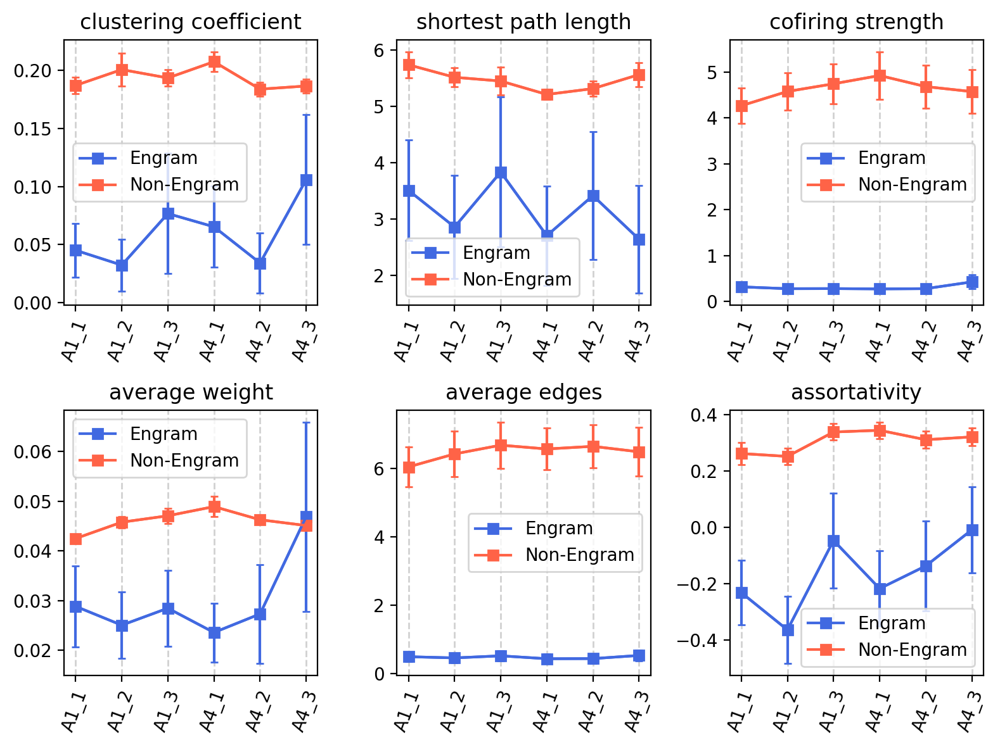

In [20]:
fig, axes = plt.subplots(ncols=3, nrows=2, figsize=(8, 6), tight_layout=True, dpi=200)

engram_color = 'royalblue'
non_engram_color = 'tomato'
shuffle_color = '0.7'

shuffle_animal_index = [0, 2, 3, 4, 5, 6, 8]

x = ['A1_1', 'A1_2', 'A1_3', 'A4_1', 'A4_2', 'A4_3']
engram_clustering_cff_df = engram_df.iloc[:, 0::6]
clustering_cff_mean, clustering_cff_sem = engram_clustering_cff_df.mean(), engram_clustering_cff_df.sem()
axes[0][0].errorbar(x, clustering_cff_mean, yerr=clustering_cff_sem, capsize=2, color=engram_color)
axes[0][0].plot(x, clustering_cff_mean, marker="s", markersize=6, color=engram_color, label='Engram')

non_engram_clustering_cff_df = non_engram_df.iloc[:, 0::6]
clustering_cff_mean, clustering_cff_sem = non_engram_clustering_cff_df.mean(), non_engram_clustering_cff_df.sem()
axes[0][0].errorbar(x, clustering_cff_mean, yerr=clustering_cff_sem, capsize=2, color=non_engram_color)
axes[0][0].plot(x, clustering_cff_mean, marker="s", markersize=6, color=non_engram_color, label='Non-Engram')

axes[0][0].legend()
axes[0][0].set_title('clustering coefficient')
axes[0][0].set_xticklabels(x, rotation=70)
axes[0][0].grid(which = "major", axis = "x", color = "0.7", alpha = 0.6, linestyle = "--", linewidth = 1)

engram_shortest_path_df = engram_df.iloc[:, 1::6]
shortest_path_mean, shortest_path_sem = engram_shortest_path_df.mean(), engram_shortest_path_df.sem()
axes[0][1].errorbar(x, shortest_path_mean, yerr=shortest_path_sem, capsize=2, color=engram_color)
axes[0][1].plot(x, shortest_path_mean, marker="s", markersize=6, color=engram_color, label='Engram')

non_engram_shortest_path_df = non_engram_df.iloc[:, 1::6]
shortest_path_mean, shortest_path_sem = non_engram_shortest_path_df.mean(), non_engram_shortest_path_df.sem()
axes[0][1].errorbar(x, shortest_path_mean, yerr=shortest_path_sem, capsize=2, color=non_engram_color)
axes[0][1].plot(x, shortest_path_mean, marker="s", markersize=6, color=non_engram_color, label='Non-Engram')

axes[0][1].legend()
axes[0][1].set_title('shortest path length')
axes[0][1].set_xticklabels(x, rotation=70)
axes[0][1].grid(which = "major", axis = "x", color = "0.7", alpha = 0.6, linestyle = "--", linewidth = 1)

engram_cofiring_strength_df = engram_df.iloc[:, 2::6]
cofiring_strength_mean, cofiring_strength_sem = engram_cofiring_strength_df.mean(), engram_cofiring_strength_df.sem()
axes[0][2].errorbar(x, cofiring_strength_mean, yerr=cofiring_strength_sem, capsize=2, color=engram_color)
axes[0][2].plot(x, cofiring_strength_mean, marker="s", markersize=6, color=engram_color, label='Engram')

non_engram_cofiring_strength_df = non_engram_df.iloc[:, 2::6]
cofiring_strength_mean, cofiring_strength_sem = non_engram_cofiring_strength_df.mean(), non_engram_cofiring_strength_df.sem()
axes[0][2].errorbar(x, cofiring_strength_mean, yerr=cofiring_strength_sem, capsize=2, color=non_engram_color)
axes[0][2].plot(x, cofiring_strength_mean, marker="s", markersize=6, color=non_engram_color, label='Non-Engram')

axes[0][2].legend()
axes[0][2].set_title('cofiring strength')
axes[0][2].set_xticklabels(x, rotation=70)
axes[0][2].grid(which = "major", axis = "x", color = "0.7", alpha = 0.6, linestyle = "--", linewidth = 1)

engram_total_weight_df = engram_df.iloc[:, 3::6]
total_weight_mean, total_weight_sem = engram_total_weight_df.mean(), engram_total_weight_df.sem()
axes[1][0].errorbar(x, total_weight_mean, yerr=total_weight_sem, capsize=2, color=engram_color)
axes[1][0].plot(x, total_weight_mean, marker="s", markersize=6, color=engram_color, label='Engram')

non_engram_total_weight_df = non_engram_df.iloc[:, 3::6]
total_weight_mean, total_weight_sem = non_engram_total_weight_df.mean(), non_engram_total_weight_df.sem()
axes[1][0].errorbar(x, total_weight_mean, yerr=total_weight_sem, capsize=2, color=non_engram_color)
axes[1][0].plot(x, total_weight_mean, marker="s", markersize=6, color=non_engram_color, label='Non-Engram')

axes[1][0].legend()
axes[1][0].set_title('average weight')
axes[1][0].set_xticklabels(x, rotation=70)
axes[1][0].grid(which = "major", axis = "x", color = "0.7", alpha = 0.6, linestyle = "--", linewidth = 1)

engram_total_edge_df = engram_df.iloc[:, 4::6]
total_edge_mean, total_edge_sem = engram_total_edge_df.mean(), engram_total_edge_df.sem()
axes[1][1].errorbar(x, total_edge_mean, yerr=total_edge_sem, capsize=2, color=engram_color)
axes[1][1].plot(x, total_edge_mean, marker="s", markersize=6, color=engram_color, label='Engram')

non_engram_total_edge_df = non_engram_df.iloc[:, 4::6]
total_edge_mean, total_edge_sem = non_engram_total_edge_df.mean(), non_engram_total_edge_df.sem()
axes[1][1].errorbar(x, total_edge_mean, yerr=total_edge_sem, capsize=2, color=non_engram_color)
axes[1][1].plot(x, total_edge_mean, marker="s", markersize=6, color=non_engram_color, label='Non-Engram')

axes[1][1].legend()
axes[1][1].set_title('average edges')
axes[1][1].set_xticklabels(x, rotation=70)
axes[1][1].grid(which = "major", axis = "x", color = "0.7", alpha = 0.6, linestyle = "--", linewidth = 1)

engram_assortativity_df = engram_df.iloc[:, 5::6]
assortativity_mean, assortativity_sem = engram_assortativity_df.mean(), engram_assortativity_df.sem()
axes[1][2].errorbar(x, assortativity_mean, yerr=assortativity_sem, capsize=2, color=engram_color)
axes[1][2].plot(x, assortativity_mean, marker="s", markersize=6, color=engram_color, label='Engram')

non_engram_assortativity_df = non_engram_df.iloc[:, 5::6]
assortativity_mean, assortativity_sem = non_engram_assortativity_df.mean(), non_engram_assortativity_df.sem()
axes[1][2].errorbar(x, assortativity_mean, yerr=assortativity_sem, capsize=2, color=non_engram_color)
axes[1][2].plot(x, assortativity_mean, marker="s", markersize=6, color=non_engram_color, label='Non-Engram')

axes[1][2].legend()
axes[1][2].set_title('assortativity')
axes[1][2].set_xticklabels(x, rotation=70)
axes[1][2].grid(which = "major", axis = "x", color = "0.7", alpha = 0.6, linestyle = "--", linewidth = 1)

fig.show()

<ipython-input-17-90123430dfe3>:22: UserWarning: FixedFormatter should only be used together with FixedLocator
  axes[0][0].set_xticklabels(x, rotation=70)
<ipython-input-17-90123430dfe3>:37: UserWarning: FixedFormatter should only be used together with FixedLocator
  axes[0][1].set_xticklabels(x, rotation=70)
<ipython-input-17-90123430dfe3>:52: UserWarning: FixedFormatter should only be used together with FixedLocator
  axes[0][2].set_xticklabels(x, rotation=70)
<ipython-input-17-90123430dfe3>:67: UserWarning: FixedFormatter should only be used together with FixedLocator
  axes[1][0].set_xticklabels(x, rotation=70)
<ipython-input-17-90123430dfe3>:82: UserWarning: FixedFormatter should only be used together with FixedLocator
  axes[1][1].set_xticklabels(x, rotation=70)


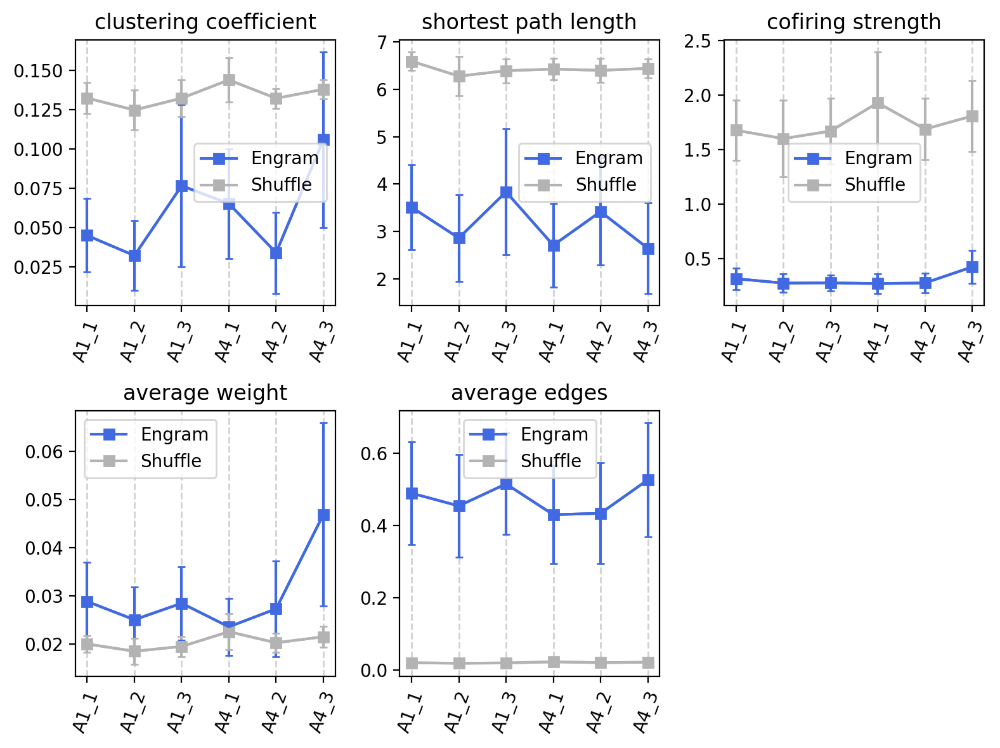

In [17]:
fig, axes = plt.subplots(ncols=3, nrows=2, figsize=(8, 6), tight_layout=True, dpi=200)

engram_color = 'royalblue'
non_engram_color = 'tomato'
shuffle_color = '0.7'

shuffle_animal_index = [0, 2, 3, 4, 5, 6, 8]

x = ['A1_1', 'A1_2', 'A1_3', 'A4_1', 'A4_2', 'A4_3']
engram_clustering_cff_df = engram_df.iloc[:, 0::6]
clustering_cff_mean, clustering_cff_sem = engram_clustering_cff_df.mean(), engram_clustering_cff_df.sem()
axes[0][0].errorbar(x, clustering_cff_mean, yerr=clustering_cff_sem, capsize=2, color=engram_color)
axes[0][0].plot(x, clustering_cff_mean, marker="s", markersize=6, color=engram_color, label='Engram')

engram_shuffle_clustering_cff_df = engram_shuffle_df.iloc[shuffle_animal_index, 0::6]
clustering_cff_mean, clustering_cff_sem = engram_shuffle_clustering_cff_df.mean(), engram_shuffle_clustering_cff_df.sem()
axes[0][0].errorbar(x, clustering_cff_mean, yerr=clustering_cff_sem, capsize=2, color=shuffle_color)
axes[0][0].plot(x, clustering_cff_mean, marker="s", markersize=6, color=shuffle_color, label='Shuffle')

axes[0][0].legend()
axes[0][0].set_title('clustering coefficient')
axes[0][0].set_xticklabels(x, rotation=70)
axes[0][0].grid(which = "major", axis = "x", color = "0.7", alpha = 0.6, linestyle = "--", linewidth = 1)

engram_shortest_path_df = engram_df.iloc[:, 1::6]
shortest_path_mean, shortest_path_sem = engram_shortest_path_df.mean(), engram_shortest_path_df.sem()
axes[0][1].errorbar(x, shortest_path_mean, yerr=shortest_path_sem, capsize=2, color=engram_color)
axes[0][1].plot(x, shortest_path_mean, marker="s", markersize=6, color=engram_color, label='Engram')

engram_shuffle_shortest_path_df = engram_shuffle_df.iloc[shuffle_animal_index, 1::6]
shortest_path_mean, shortest_path_sem = engram_shuffle_shortest_path_df.mean(), engram_shuffle_shortest_path_df.sem()
axes[0][1].errorbar(x, shortest_path_mean, yerr=shortest_path_sem, capsize=2, color=shuffle_color)
axes[0][1].plot(x, shortest_path_mean, marker="s", markersize=6, color=shuffle_color, label='Shuffle')

axes[0][1].legend()
axes[0][1].set_title('shortest path length')
axes[0][1].set_xticklabels(x, rotation=70)
axes[0][1].grid(which = "major", axis = "x", color = "0.7", alpha = 0.6, linestyle = "--", linewidth = 1)

engram_cofiring_strength_df = engram_df.iloc[:, 2::6]
cofiring_strength_mean, cofiring_strength_sem = engram_cofiring_strength_df.mean(), engram_cofiring_strength_df.sem()
axes[0][2].errorbar(x, cofiring_strength_mean, yerr=cofiring_strength_sem, capsize=2, color=engram_color)
axes[0][2].plot(x, cofiring_strength_mean, marker="s", markersize=6, color=engram_color, label='Engram')

engram_shuffle_cofiring_strength_df = engram_shuffle_df.iloc[shuffle_animal_index, 2::6]
cofiring_strength_mean, cofiring_strength_sem = engram_shuffle_cofiring_strength_df.mean(), engram_shuffle_cofiring_strength_df.sem()
axes[0][2].errorbar(x, cofiring_strength_mean, yerr=cofiring_strength_sem, capsize=2, color=shuffle_color)
axes[0][2].plot(x, cofiring_strength_mean, marker="s", markersize=6, color=shuffle_color, label='Shuffle')

axes[0][2].legend()
axes[0][2].set_title('cofiring strength')
axes[0][2].set_xticklabels(x, rotation=70)
axes[0][2].grid(which = "major", axis = "x", color = "0.7", alpha = 0.6, linestyle = "--", linewidth = 1)

engram_total_weight_df = engram_df.iloc[:, 3::6]
total_weight_mean, total_weight_sem = engram_total_weight_df.mean(), engram_total_weight_df.sem()
axes[1][0].errorbar(x, total_weight_mean, yerr=total_weight_sem, capsize=2, color=engram_color)
axes[1][0].plot(x, total_weight_mean, marker="s", markersize=6, color=engram_color, label='Engram')

engram_shuffle_total_weight_df = engram_shuffle_df.iloc[shuffle_animal_index, 3::6]
total_weight_mean, total_weight_sem = engram_shuffle_total_weight_df.mean(), engram_shuffle_total_weight_df.sem()
axes[1][0].errorbar(x, total_weight_mean, yerr=total_weight_sem, capsize=2, color=shuffle_color)
axes[1][0].plot(x, total_weight_mean, marker="s", markersize=6, color=shuffle_color, label='Shuffle')

axes[1][0].legend()
axes[1][0].set_title('average weight')
axes[1][0].set_xticklabels(x, rotation=70)
axes[1][0].grid(which = "major", axis = "x", color = "0.7", alpha = 0.6, linestyle = "--", linewidth = 1)

engram_total_edge_df = engram_df.iloc[:, 4::6]
total_edge_mean, total_edge_sem = engram_total_edge_df.mean(), engram_total_edge_df.sem()
axes[1][1].errorbar(x, total_edge_mean, yerr=total_edge_sem, capsize=2, color=engram_color)
axes[1][1].plot(x, total_edge_mean, marker="s", markersize=6, color=engram_color, label='Engram')

engram_shuffle_total_edge_df = engram_shuffle_df.iloc[shuffle_animal_index, 3::6]
total_edge_mean, total_edge_sem = engram_shuffle_total_edge_df.mean(), engram_shuffle_total_edge_df.sem()
axes[1][1].errorbar(x, total_edge_mean, yerr=total_edge_sem, capsize=2, color=shuffle_color)
axes[1][1].plot(x, total_edge_mean, marker="s", markersize=6, color=shuffle_color, label='Shuffle')

axes[1][1].legend()
axes[1][1].set_title('average edges')
axes[1][1].set_xticklabels(x, rotation=70)
axes[1][1].grid(which = "major", axis = "x", color = "0.7", alpha = 0.6, linestyle = "--", linewidth = 1)


axes[1][2].set_visible(False)

fig.show()

<ipython-input-19-d4ed465e34c9>:21: UserWarning: FixedFormatter should only be used together with FixedLocator
  axes[0][0].set_xticklabels(x, rotation=70)
<ipython-input-19-d4ed465e34c9>:36: UserWarning: FixedFormatter should only be used together with FixedLocator
  axes[0][1].set_xticklabels(x, rotation=70)
<ipython-input-19-d4ed465e34c9>:51: UserWarning: FixedFormatter should only be used together with FixedLocator
  axes[0][2].set_xticklabels(x, rotation=70)
<ipython-input-19-d4ed465e34c9>:66: UserWarning: FixedFormatter should only be used together with FixedLocator
  axes[1][0].set_xticklabels(x, rotation=70)
<ipython-input-19-d4ed465e34c9>:81: UserWarning: FixedFormatter should only be used together with FixedLocator
  axes[1][1].set_xticklabels(x, rotation=70)


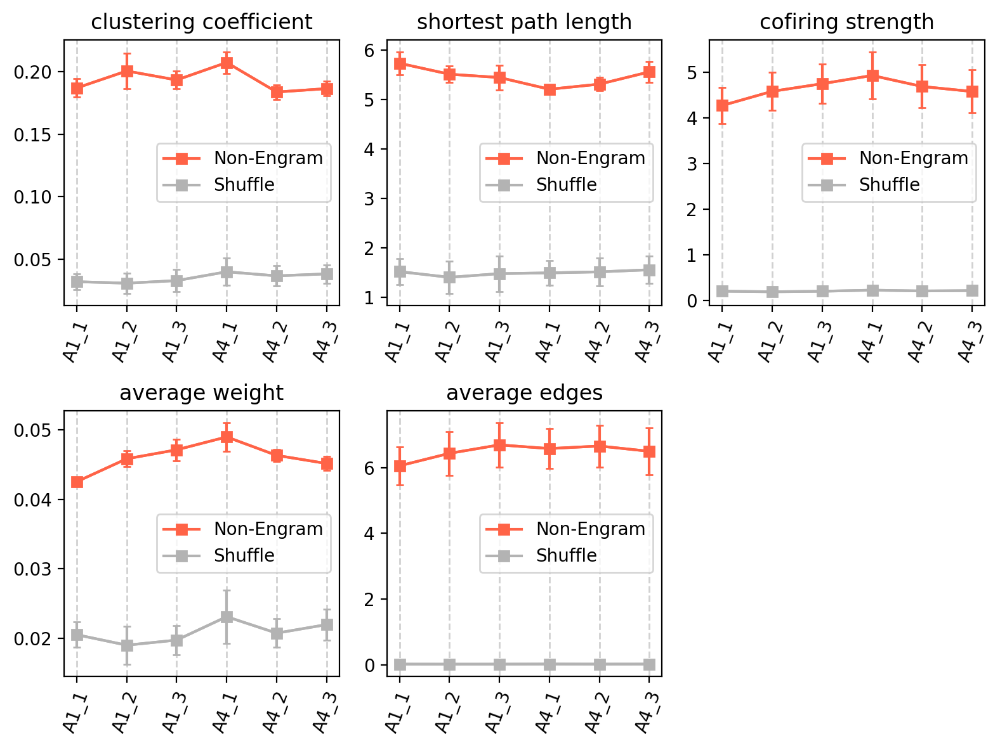

In [19]:
fig, axes = plt.subplots(ncols=3, nrows=2, figsize=(8, 6), tight_layout=True, dpi=200)

non_engram_color = 'tomato'
shuffle_color = '0.7'

shuffle_animal_index = [0, 2, 3, 4, 5, 6, 8]

x = ['A1_1', 'A1_2', 'A1_3', 'A4_1', 'A4_2', 'A4_3']
non_engram_clustering_cff_df = non_engram_df.iloc[:, 0::6]
clustering_cff_mean, clustering_cff_sem = non_engram_clustering_cff_df.mean(), non_engram_clustering_cff_df.sem()
axes[0][0].errorbar(x, clustering_cff_mean, yerr=clustering_cff_sem, capsize=2, color=non_engram_color)
axes[0][0].plot(x, clustering_cff_mean, marker="s", markersize=6, color=non_engram_color, label='Non-Engram')

non_engram_shuffle_clustering_cff_df = non_engram_shuffle_df.iloc[shuffle_animal_index, 0::6]
clustering_cff_mean, clustering_cff_sem = non_engram_shuffle_clustering_cff_df.mean(), non_engram_shuffle_clustering_cff_df.sem()
axes[0][0].errorbar(x, clustering_cff_mean, yerr=clustering_cff_sem, capsize=2, color=shuffle_color)
axes[0][0].plot(x, clustering_cff_mean, marker="s", markersize=6, color=shuffle_color, label='Shuffle')

axes[0][0].legend()
axes[0][0].set_title('clustering coefficient')
axes[0][0].set_xticklabels(x, rotation=70)
axes[0][0].grid(which = "major", axis = "x", color = "0.7", alpha = 0.6, linestyle = "--", linewidth = 1)

non_engram_shortest_path_df = non_engram_df.iloc[:, 1::6]
shortest_path_mean, shortest_path_sem = non_engram_shortest_path_df.mean(), non_engram_shortest_path_df.sem()
axes[0][1].errorbar(x, shortest_path_mean, yerr=shortest_path_sem, capsize=2, color=non_engram_color)
axes[0][1].plot(x, shortest_path_mean, marker="s", markersize=6, color=non_engram_color, label='Non-Engram')

non_engram_shuffle_shortest_path_df = non_engram_shuffle_df.iloc[shuffle_animal_index, 1::6]
shortest_path_mean, shortest_path_sem = non_engram_shuffle_shortest_path_df.mean(), non_engram_shuffle_shortest_path_df.sem()
axes[0][1].errorbar(x, shortest_path_mean, yerr=shortest_path_sem, capsize=2, color=shuffle_color)
axes[0][1].plot(x, shortest_path_mean, marker="s", markersize=6, color=shuffle_color, label='Shuffle')

axes[0][1].legend()
axes[0][1].set_title('shortest path length')
axes[0][1].set_xticklabels(x, rotation=70)
axes[0][1].grid(which = "major", axis = "x", color = "0.7", alpha = 0.6, linestyle = "--", linewidth = 1)

non_engram_cofiring_strength_df = non_engram_df.iloc[:, 2::6]
cofiring_strength_mean, cofiring_strength_sem = non_engram_cofiring_strength_df.mean(), non_engram_cofiring_strength_df.sem()
axes[0][2].errorbar(x, cofiring_strength_mean, yerr=cofiring_strength_sem, capsize=2, color=non_engram_color)
axes[0][2].plot(x, cofiring_strength_mean, marker="s", markersize=6, color=non_engram_color, label='Non-Engram')

non_engram_shuffle_cofiring_strength_df = non_engram_shuffle_df.iloc[shuffle_animal_index, 2::6]
cofiring_strength_mean, cofiring_strength_sem = non_engram_shuffle_cofiring_strength_df.mean(), non_engram_shuffle_cofiring_strength_df.sem()
axes[0][2].errorbar(x, cofiring_strength_mean, yerr=cofiring_strength_sem, capsize=2, color=shuffle_color)
axes[0][2].plot(x, cofiring_strength_mean, marker="s", markersize=6, color=shuffle_color, label='Shuffle')

axes[0][2].legend()
axes[0][2].set_title('cofiring strength')
axes[0][2].set_xticklabels(x, rotation=70)
axes[0][2].grid(which = "major", axis = "x", color = "0.7", alpha = 0.6, linestyle = "--", linewidth = 1)

non_engram_total_weight_df = non_engram_df.iloc[:, 3::6]
total_weight_mean, total_weight_sem = non_engram_total_weight_df.mean(), non_engram_total_weight_df.sem()
axes[1][0].errorbar(x, total_weight_mean, yerr=total_weight_sem, capsize=2, color=non_engram_color)
axes[1][0].plot(x, total_weight_mean, marker="s", markersize=6, color=non_engram_color, label='Non-Engram')

non_engram_shuffle_total_weight_df = non_engram_shuffle_df.iloc[shuffle_animal_index, 3::6]
total_weight_mean, total_weight_sem = non_engram_shuffle_total_weight_df.mean(), non_engram_shuffle_total_weight_df.sem()
axes[1][0].errorbar(x, total_weight_mean, yerr=total_weight_sem, capsize=2, color=shuffle_color)
axes[1][0].plot(x, total_weight_mean, marker="s", markersize=6, color=shuffle_color, label='Shuffle')

axes[1][0].legend()
axes[1][0].set_title('average weight')
axes[1][0].set_xticklabels(x, rotation=70)
axes[1][0].grid(which = "major", axis = "x", color = "0.7", alpha = 0.6, linestyle = "--", linewidth = 1)

non_engram_total_edge_df = non_engram_df.iloc[:, 4::6]
total_edge_mean, total_edge_sem = non_engram_total_edge_df.mean(), non_engram_total_edge_df.sem()
axes[1][1].errorbar(x, total_edge_mean, yerr=total_edge_sem, capsize=2, color=non_engram_color)
axes[1][1].plot(x, total_edge_mean, marker="s", markersize=6, color=non_engram_color, label='Non-Engram')

non_engram_shuffle_total_edge_df = non_engram_shuffle_df.iloc[shuffle_animal_index, 3::6]
total_edge_mean, total_edge_sem = non_engram_shuffle_total_edge_df.mean(), non_engram_shuffle_total_edge_df.sem()
axes[1][1].errorbar(x, total_edge_mean, yerr=total_edge_sem, capsize=2, color=shuffle_color)
axes[1][1].plot(x, total_edge_mean, marker="s", markersize=6, color=shuffle_color, label='Shuffle')

axes[1][1].legend()
axes[1][1].set_title('average edges')
axes[1][1].set_xticklabels(x, rotation=70)
axes[1][1].grid(which = "major", axis = "x", color = "0.7", alpha = 0.6, linestyle = "--", linewidth = 1)


axes[1][2].set_visible(False)

fig.show()

In [21]:
non_engram_shuffle_df.mean()

context  feature               
A1_1     clustering coefficient    0.022284
         shortest path length      1.063042
         co-firing strength        0.140431
         average weight            0.014392
         average edges             0.181445
         assortativity             0.000000
A1_2     clustering coefficient    0.021455
         shortest path length      0.982430
         co-firing strength        0.131684
         average weight            0.013341
         average edges             0.169961
         assortativity             0.000000
A1_3     clustering coefficient    0.022896
         shortest path length      1.034489
         co-firing strength        0.139146
         average weight            0.013853
         average edges             0.178880
         assortativity             0.000000
A4_1     clustering coefficient    0.027847
         shortest path length      1.045342
         co-firing strength        0.156133
         average weight            0.016202


In [22]:
engram_shuffle_df.mean()

context  feature               
A1_1     clustering coefficient    0.141496
         shortest path length      6.485439
         co-firing strength        1.934753
         average weight            0.021257
         average edges             2.473262
         assortativity             0.000000
A1_2     clustering coefficient    0.138917
         shortest path length      6.169405
         co-firing strength        2.006799
         average weight            0.021388
         average edges             2.581055
         assortativity             0.000000
A1_3     clustering coefficient    0.143048
         shortest path length      6.210535
         co-firing strength        2.067290
         average weight            0.022476
         average edges             2.655269
         assortativity             0.000000
A4_1     clustering coefficient    0.152341
         shortest path length      6.438043
         co-firing strength        2.024962
         average weight            0.022248
